**Propose two questions (non-predictive) that you believe are interesting to
explore and can be answered using the provided dataset (at least one question should be answered using hypothesis test). Briefly describe why you think those questions are interesting to whom.**

* *What is the job title when the rating is between 4 and 5 with the sector will be Information Technology?*
    * Someone Searched about the jobs that he want to know the job title with the highest rating.
* *Do the companies which have more than 10000 employees that it's Revenue can be more than 10 billion?*
    * Someone Searched about the Revenue
* *What did the names of companies find between 1625 and 1799 years?*
    * Someone Searched about the Companies

# **Import Libraries**

I will import the libraries which are need.

In [ ]:
# (for mathematical operations) used for working with arrays. It also has functions for working in domain of linear algebra, fourier transform, and matrices.
import numpy as np

import pandas as pd

# (for data visualization) for creating static, animated, and interactive visualizations
import matplotlib.pyplot as plt   
import seaborn as sns

# provides a series of visualisations to understand the presence and distribution of missing data within data. we can identify where missing values occur, the extent of the missingness and whether any of the missing values are correlated with each other.
import missingno as msno

from sklearn.impute import SimpleImputer

# For conver categorical data to numerical data
from sklearn.preprocessing import LabelEncoder


from scipy import stats

# saves from multiple prints and display statements,
# will let you see multiple outputs in the same cell
# allow display of multiple outputs by running one code cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Ignore the warning
import warnings
warnings.filterwarnings("ignore")

# **Load Data**

I Will load and read the data then i will known some informatiom about it such as Does it have null values or not?, The data type of the data and column's names. Check the data has null values and duplicates rows.

In [ ]:
# load data and read it from sdf files data
df = pd.read_csv('/content/drive/MyDrive/Data Analysis/Assignments/1/data1.csv')

# Show data 
df

,Job Title,Salary Estimate,Job Description,Rating,Company Name,Location,Headquarters,Size,Founded,Type of ownership,Industry,Sector,Revenue,Competitors,Easy Apply
0,Senior Data Scientist,$111K-$181K (Glassdoor est.),"ABOUT HOPPER\n\nAt Hopper, we’re on a mission ...",3.5,Hopper\n3.5,"New York, NY","Montreal, Canada",501 to 1000 employees,2007,Company - Private,Travel Agencies,Travel & Tourism,Unknown / Non-Applicable,-1,-1
1,"Data Scientist, Product Analytics",$111K-$181K (Glassdoor est.),"At Noom, we use scientifically proven methods ...",4.5,Noom US\n4.5,"New York, NY","New York, NY",1001 to 5000 employees,2008,Company - Private,"Health, Beauty, & Fitness",Consumer Services,Unknown / Non-Applicable,-1,-1
2,Data Science Manager,$111K-$181K (Glassdoor est.),Decode_M\n\nhttps://www.decode-m.com/\n\nData ...,-1.0,Decode_M,"New York, NY","New York, NY",1 to 50 employees,-1,Unknown,-1,-1,Unknown / Non-Applicable,-1,TRUE
3,Data Analyst,$111K-$181K (Glassdoor est.),Sapphire Digital seeks a dynamic and driven mi...,3.4,Sapphire Digital\n3.4,"Lyndhurst, NJ","Lyndhurst, NJ",201 to 500 employees,2019,Company - Private,Internet,Information Technology,Unknown / Non-Applicable,"Zocdoc, Healthgrades",-1
4,"Director, Data Science",$111K-$181K (Glassdoor est.),"Director, Data Science - (200537)\nDescription...",3.4,United Entertainment Group\n3.4,"New York, NY","New York, NY",51 to 200 employees,2007,Company - Private,Advertising & Marketing,Business Services,Unknown / Non-Applicable,"BBDO, Grey Group, Droga5",-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16155,Cloud Engineer,$76K-$128K (Glassdoor est.),The Expertise You Have Proven expertise in dev...,4.5,PMG Global\n4.5,"Westlake, TX","Herndon, VA",1 to 50 employees,-1,Company - Private,Computer Hardware & Software,Information Technology,$1 to $5 million (USD),-1,-1
16156,Electrical Engineer,$76K-$128K (Glassdoor est.),Lockheed Martin is seeking a Circuit and FPGA ...,2.9,Albin Engineering Services\n2.9,"Fort Worth, TX","Santa Clara, CA",51 to 200 employees,1993,Company - Private,Staffing & Outsourcing,Business Services,$5 to $10 million (USD),-1,-1
16157,Sr. Big Data Engineer,$76K-$128K (Glassdoor est.),Posting Title Principal Data Engineer (Contrac...,3.7,Cincinnati Bell Technology Solutions\n3.7,"Irving, TX","Cincinnati, OH",501 to 1000 employees,-1,Company - Private,IT Services,Information Technology,$100 to $500 million (USD),-1,-1
16158,Senior Big Data / ETL Engineer,$76K-$128K (Glassdoor est.),"Your Opportunity\n\nCharles Schwab & Co., Inc ...",3.5,Schwab\n3.5,"Westlake, TX","Dettenheim, Germany",Unknown,-1,Company - Public,-1,-1,Unknown / Non-Applicable,-1,-1


In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# Show the dimension of the data
df.shape

(16160, 15)

In [ ]:
# Show the information of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16160 entries, 0 to 16159
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Job Title          16160 non-null  object 
 1   Salary Estimate    16160 non-null  object 
 2   Job Description    16160 non-null  object 
 3   Rating             16160 non-null  float64
 4   Company Name       16158 non-null  object 
 5   Location           16160 non-null  object 
 6   Headquarters       16160 non-null  object 
 7   Size               16160 non-null  object 
 8   Founded            16160 non-null  int64  
 9   Type of ownership  16160 non-null  object 
 10  Industry           16160 non-null  object 
 11  Sector             16160 non-null  object 
 12  Revenue            16160 non-null  object 
 13  Competitors        16160 non-null  object 
 14  Easy Apply         16160 non-null  object 
dtypes: float64(1), int64(1), object(13)
memory usage: 1.8+ MB


In [ ]:
# Show the details of the data
df.describe(include= 'all')

,Job Title,Salary Estimate,Job Description,Rating,Company Name,Location,Headquarters,Size,Founded,Type of ownership,Industry,Sector,Revenue,Competitors,Easy Apply
count,16160,16160,16160,16160.000000,16158,16160,16160,16160,16160.000000,16160,16160,16160,16160,16160,16160
unique,7208,574,13280,NaN,6239,763,1181,9,NaN,15,117,26,14,1070,2
top,Data Analyst,$48K-$87K (Glassdoor est.),"Job description\nInterpret data, analyze resul...",NaN,"Staffigo Technical Services, LLC\n5.0","New York, NY","New York, NY",10000+ employees,NaN,Company - Private,IT Services,Information Technology,Unknown / Non-Applicable,-1,-1
freq,1384,95,47,NaN,440,1133,1105,3424,NaN,8706,2315,4521,4277,11824,15553
mean,NaN,NaN,NaN,3.295056,NaN,NaN,NaN,NaN,1456.283911,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,1.550252,NaN,NaN,NaN,NaN,871.461505,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,-1.000000,NaN,NaN,NaN,NaN,-1.000000,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,3.200000,NaN,NaN,NaN,NaN,-1.000000,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,3.700000,NaN,NaN,NaN,NaN,1980.000000,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,4.100000,NaN,NaN,NaN,NaN,2002.000000,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Check the count of duplicate rows in the data
df.duplicated().sum()

23

In [ ]:
# The count of the null values and sort it 
df.isnull().sum().sort_values(ascending = False)

Company Name         2
Job Title            0
Salary Estimate      0
Job Description      0
Rating               0
Location             0
Headquarters         0
Size                 0
Founded              0
Type of ownership    0
Industry             0
Sector               0
Revenue              0
Competitors          0
Easy Apply           0
dtype: int64

**Finding:**
  * The data has 16160 rows and 15 columns.
  * The data has 15 columns that column's names are Company Name 'Job Title', 'Salary Estimate', 'Job Description', 'Rating', 'Location', 'Headquarters', 'Size', 'Founded', 'Type of ownership', 'Industry', 'Sector', 'Revenue', 'Competitors' and 'Easy Apply'.
  * Data types of the data are float, int and object. The number of column's float is one column. The number of column's int is one column. The number of columns' object are  13 column. 
  * The data has null values. The count of null values are  2 in the Company Name. 
  * The Data has duplicate rows. the number of duplicate rows is 23.

# **Queck look on The Data**

In [ ]:
# Show The unique values in the data
df.nunique().sort_values(ascending = True)

Easy Apply               2
Size                     9
Revenue                 14
Type of ownership       15
Sector                  26
Rating                  39
Industry               117
Founded                218
Salary Estimate        574
Location               763
Competitors           1070
Headquarters          1181
Company Name          6239
Job Title             7208
Job Description      13280
dtype: int64

<!-- ## **Looking the Features and label** -->
## **Looking to the Easy Apply**

I will show data in this columns and make visualization by using pie char and box plot. I will make handle the values

In [ ]:
# Show The values and counts it of Easy Apply in the data
df['Easy Apply'].value_counts()

-1      15553
TRUE      607
Name: Easy Apply, dtype: int64

-1      15553
TRUE      607
Name: Easy Apply, dtype: int64


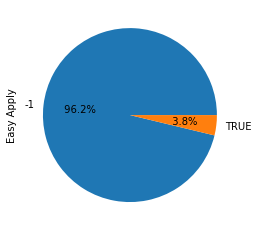

In [ ]:
# check data scale
print(df['Easy Apply'].value_counts())
df.groupby('Easy Apply').size().plot(kind='pie',label = 'Easy Apply',autopct='%5.1f%%') # pie plot to illustate unbalance data

In [ ]:
# Replace the values of the Easy Apply in the data Sun
df['Easy Apply'] = df['Easy Apply'].replace(to_replace = ['TRUE'], value = 1)
df['Easy Apply'] = df['Easy Apply'].replace(to_replace = ['-1'], value = 0)

**Finding:**

  The Easy Apply has values that the values are -1 and TRUE. the count of the -1 is 15553. the count of TRUE is 607.
  So, I will replace the -1 to 0 and the TRUE to 1. to clean the data.

In [ ]:
# Show The values and counts it of Easy Apply in the data
df['Easy Apply'].value_counts()

0    15553
1      607
Name: Easy Apply, dtype: int64

In [ ]:
# Check the Data Type of the Easy Apply in the data
df['Easy Apply'].dtypes

dtype('int64')

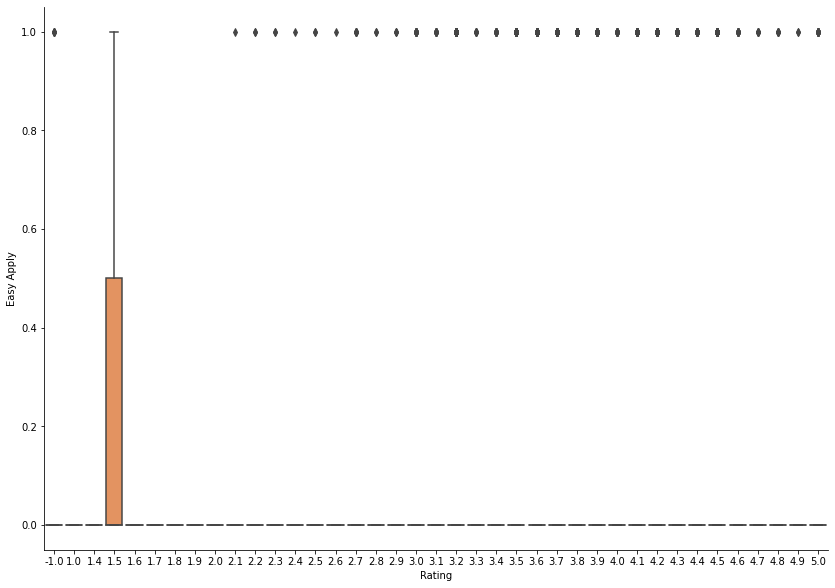

In [ ]:
# Show the data by using box plot
sns.catplot(x="Rating", y="Easy Apply",data=df, kind='box', height=8.27, aspect=11.7/8.27)

## **Looking the Salary Estimate and Handling it**

I will show data in this columns and make visualization by using bar char and box plot. I will clean the values.

In [ ]:
# Show The values and counts it of Salary Estimate in the data
df['Salary Estimate'].value_counts()

$48K-$87K (Glassdoor est.)      95
$45K-$82K (Glassdoor est.)      92
$60K-$109K (Glassdoor est.)     92
$43K-$76K (Glassdoor est.)      91
$39K-$69K (Glassdoor est.)      91
                                ..
$114K-$134K (Glassdoor est.)     1
$69K-$119K (Glassdoor est.)      1
$41K-$74K (Glassdoor est.)       1
$59K-$72K (Glassdoor est.)       1
$68K-$114K (Glassdoor est.)      1
Name: Salary Estimate, Length: 574, dtype: int64

In [ ]:
# # Show the data of Salary Estimate by using bar char
# df['Salary Estimate'].value_counts().plot(kind='bar', figsize=(200,50))

In [ ]:
# # Show the data by using box plot
# sns.catplot(x="Rating", y="Salary Estimate",data=df, kind='box', height=150, aspect=11.7/70)

In [ ]:
# check the counts of the -1 values in the data
df['Salary Estimate'].isin(['-1']).sum()

46

In [ ]:
df['Salary Estimate'].replace('-1', np.nan, regex=True, inplace=True)

In [ ]:
# check the counts of the -1 values in the data
df['Salary Estimate'].isin(['-1']).sum()

0

In [ ]:
# split the data in the 'Salary Estimate' to Salary_min and Salary max
df[['Salary_min','Salary_max']] = df['Salary Estimate'].str.split("-",expand=True)
# Get the Salary Estimate
df['Salary_estimate'] = df['Salary Estimate'].str.extract(r"\((.*?)\)", expand=False)
# Delete the columns of the Salary Estimate
df.drop('Salary Estimate', inplace= True, axis= 1)

In [ ]:
# Show the values of Salary_estimate and count it in the data 
df['Salary_estimate'].value_counts()

Glassdoor est.    15880
Employer est.       234
Name: Salary_estimate, dtype: int64

In [ ]:
# Remove ect. from salary estemate in the data
df['Salary_estimate'].replace(to_replace=' est.', value='', inplace= True, regex = True)

In [ ]:
# get the min, max and average of the salary 
df.Salary_min = df.Salary_min.str.extract('(\d+)').astype('float')*1000
df.Salary_max = df.Salary_max.str.extract('(\d+)').astype('float')*1000
df['Salary_avg'] = (df.Salary_max+df.Salary_min)/2

**Finding:**

I found the -1 and the text's format is 'number K - $number K (text)'.

So, 

  * I will clean this column by replace the 'to' to '-' and remove the '$' from this column. 
  * I will split this columns and create columns to min salary, max salary and average salary.
  * I delete this column.
  * I will create new columns to the estimate salary.
  * Replace the -1 to nan values.

In [ ]:
df  # Show the data

,Job Title,Job Description,Rating,Company Name,Location,Headquarters,Size,Founded,Type of ownership,Industry,Sector,Revenue,Competitors,Easy Apply,Salary_min,Salary_max,Salary_estimate,Salary_avg
0,Senior Data Scientist,"ABOUT HOPPER\n\nAt Hopper, we’re on a mission ...",3.5,Hopper\n3.5,"New York, NY","Montreal, Canada",501 to 1000 employees,2007,Company - Private,Travel Agencies,Travel & Tourism,Unknown / Non-Applicable,-1,0,111000.0,181000.0,Glassdoor,146000.0
1,"Data Scientist, Product Analytics","At Noom, we use scientifically proven methods ...",4.5,Noom US\n4.5,"New York, NY","New York, NY",1001 to 5000 employees,2008,Company - Private,"Health, Beauty, & Fitness",Consumer Services,Unknown / Non-Applicable,-1,0,111000.0,181000.0,Glassdoor,146000.0
2,Data Science Manager,Decode_M\n\nhttps://www.decode-m.com/\n\nData ...,-1.0,Decode_M,"New York, NY","New York, NY",1 to 50 employees,-1,Unknown,-1,-1,Unknown / Non-Applicable,-1,1,111000.0,181000.0,Glassdoor,146000.0
3,Data Analyst,Sapphire Digital seeks a dynamic and driven mi...,3.4,Sapphire Digital\n3.4,"Lyndhurst, NJ","Lyndhurst, NJ",201 to 500 employees,2019,Company - Private,Internet,Information Technology,Unknown / Non-Applicable,"Zocdoc, Healthgrades",0,111000.0,181000.0,Glassdoor,146000.0
4,"Director, Data Science","Director, Data Science - (200537)\nDescription...",3.4,United Entertainment Group\n3.4,"New York, NY","New York, NY",51 to 200 employees,2007,Company - Private,Advertising & Marketing,Business Services,Unknown / Non-Applicable,"BBDO, Grey Group, Droga5",0,111000.0,181000.0,Glassdoor,146000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16155,Cloud Engineer,The Expertise You Have Proven expertise in dev...,4.5,PMG Global\n4.5,"Westlake, TX","Herndon, VA",1 to 50 employees,-1,Company - Private,Computer Hardware & Software,Information Technology,$1 to $5 million (USD),-1,0,76000.0,128000.0,Glassdoor,102000.0
16156,Electrical Engineer,Lockheed Martin is seeking a Circuit and FPGA ...,2.9,Albin Engineering Services\n2.9,"Fort Worth, TX","Santa Clara, CA",51 to 200 employees,1993,Company - Private,Staffing & Outsourcing,Business Services,$5 to $10 million (USD),-1,0,76000.0,128000.0,Glassdoor,102000.0
16157,Sr. Big Data Engineer,Posting Title Principal Data Engineer (Contrac...,3.7,Cincinnati Bell Technology Solutions\n3.7,"Irving, TX","Cincinnati, OH",501 to 1000 employees,-1,Company - Private,IT Services,Information Technology,$100 to $500 million (USD),-1,0,76000.0,128000.0,Glassdoor,102000.0
16158,Senior Big Data / ETL Engineer,"Your Opportunity\n\nCharles Schwab & Co., Inc ...",3.5,Schwab\n3.5,"Westlake, TX","Dettenheim, Germany",Unknown,-1,Company - Public,-1,-1,Unknown / Non-Applicable,-1,0,76000.0,128000.0,Glassdoor,102000.0


In [ ]:
df['Salary_avg'].isnull().sum()

46

## **Looking the Size**

I will show data in this columns and make visualization by using bar char and box plot. I will clean and handling the values

In [ ]:
# Show The values and counts it of Size in the data
df['Size'].value_counts()

10000+ employees           3424
51 to 200 employees        2891
1001 to 5000 employees     2557
1 to 50 employees          2180
201 to 500 employees       1645
501 to 1000 employees      1325
-1                          924
5001 to 10000 employees     885
Unknown                     329
Name: Size, dtype: int64

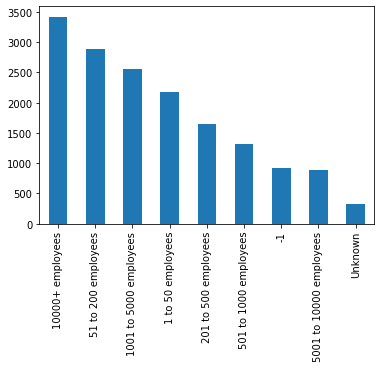

In [ ]:
# Show the data of Size by using bar char
df['Size'].value_counts().plot(kind='bar')

In [ ]:
# Replace some values in the data
df.Size = df.Size.str.replace('to','-', regex=True)
df.Size = df.Size.str.replace(' employees','', regex=True)

In [ ]:
# # Replace the -1 value to Unknown in this column 
# df.Size = df.Size.str.replace('-1','Unknown')

In [ ]:
# Show The values and counts it of Size in the data
df['Size'].value_counts()

10000+          3424
51 - 200        2891
1001 - 5000     2557
1 - 50          2180
201 - 500       1645
501 - 1000      1325
-1               924
5001 - 10000     885
Unknown          329
Name: Size, dtype: int64

**Finding:**

  I found the -1, Unknown and the text's format is 'number to number employees'

  So, I will clean this column by replace the 'to' to '-' and remove the word's employees from this column. 


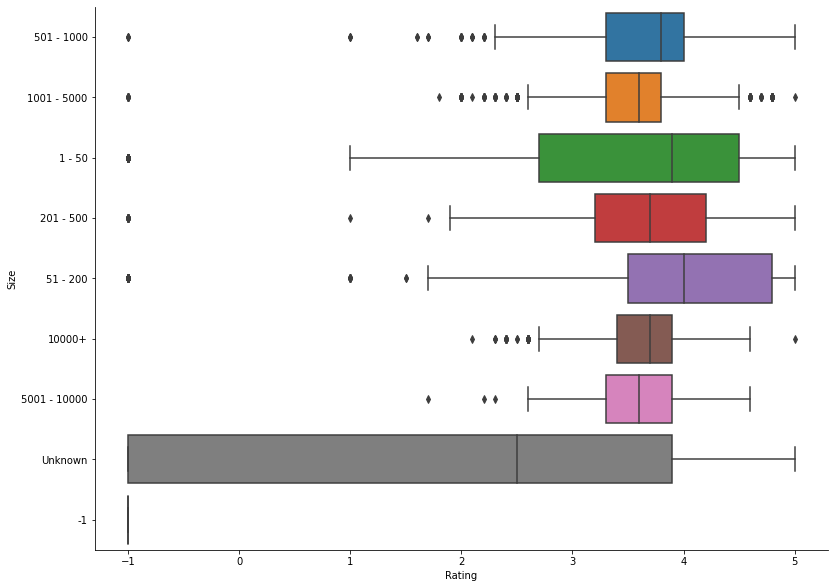

In [ ]:
# Show the data by using box plot
sns.catplot(x='Rating', y='Size',data=df, kind='box', height=8.27, aspect=11.7/8.27)

## **Looking the Revenue**

I will show data in this columns and make visualization by using bar char and box plot. I will clean the values.

In [ ]:
# Show The values and counts it of Revenue in the data
df['Revenue'].value_counts()

Unknown / Non-Applicable            4277
$10+ billion (USD)                  1995
$100 to $500 million (USD)          1603
$50 to $100 million (USD)           1296
-1                                   924
$2 to $5 billion (USD)               910
$10 to $25 million (USD)             906
$25 to $50 million (USD)             770
$1 to $5 million (USD)               718
$1 to $2 billion (USD)               709
$5 to $10 billion (USD)              551
$500 million to $1 billion (USD)     521
Less than $1 million (USD)           512
$5 to $10 million (USD)              468
Name: Revenue, dtype: int64

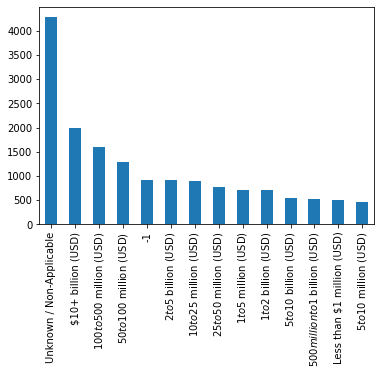

In [ ]:
# Show the data of Revenue by using bar char
df['Revenue'].value_counts().plot(kind='bar')

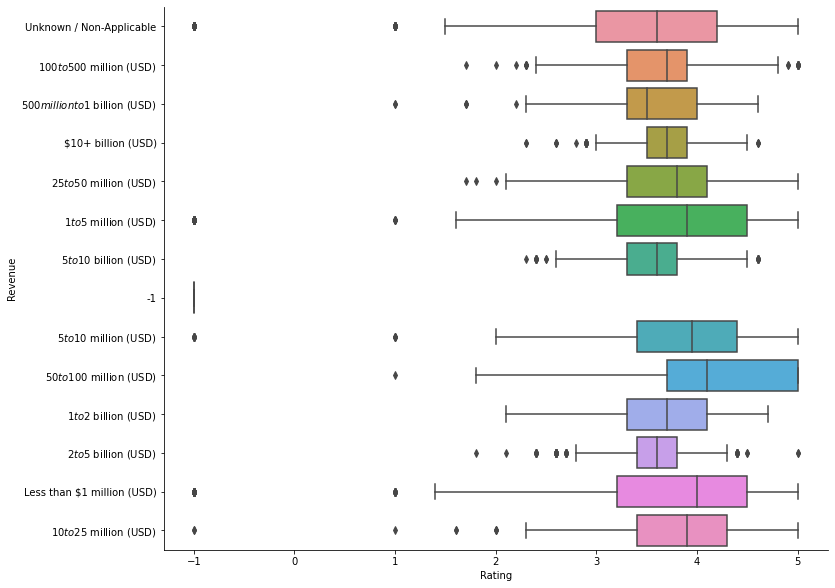

In [ ]:
# Show the data by using box plot
sns.catplot(x="Rating", y="Revenue",data=df, kind='box', height=8.27, aspect=11.7/8.27)

In [ ]:
# Replace some of the values of Revenue in the data
df['Revenue'] = df['Revenue'].replace(to_replace=[r'\$', ' \(USD\)'], value= '', regex = True)
# # Replace the -1 value to Unknown in this column 
# df.Revenue = df.Revenue.str.replace('-1','Unknown / Non-Applicable')

**Finding:**

  I found the -1, Unknown / Non-Applicable and the text's format is 'number text to $number text (USD)'

  So, I will clean this column by replace the 'to' to '-' and remove the word's (USD) and '$' from this column.

In [ ]:
# Show The values and counts it of Revenue in the data
df['Revenue'].value_counts()

Unknown / Non-Applicable    4277
10+ billion                 1995
100 to 500 million          1603
50 to 100 million           1296
-1                           924
2 to 5 billion               910
10 to 25 million             906
25 to 50 million             770
1 to 5 million               718
1 to 2 billion               709
5 to 10 billion              551
500 million to 1 billion     521
Less than 1 million          512
5 to 10 million              468
Name: Revenue, dtype: int64

## **Looking the Type of ownership**

I will show data in this columns and make visualization by using bar char and box plot. I will clean the values.

In [ ]:
# Show The values and counts it of Type of ownership in the data
df['Type of ownership'].value_counts()

Company - Private                 8706
Company - Public                  4083
-1                                 924
Nonprofit Organization             697
Subsidiary or Business Segment     694
Government                         321
College / University               216
Unknown                            153
Hospital                           115
Contract                            96
Private Practice / Firm             52
Other Organization                  50
School / School District            34
Self-employed                       12
Franchise                            7
Name: Type of ownership, dtype: int64

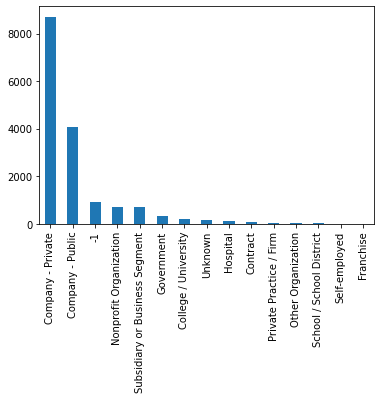

In [ ]:
# Show the data of Type of ownership by using bar char
df['Type of ownership'].value_counts().plot(kind='bar')

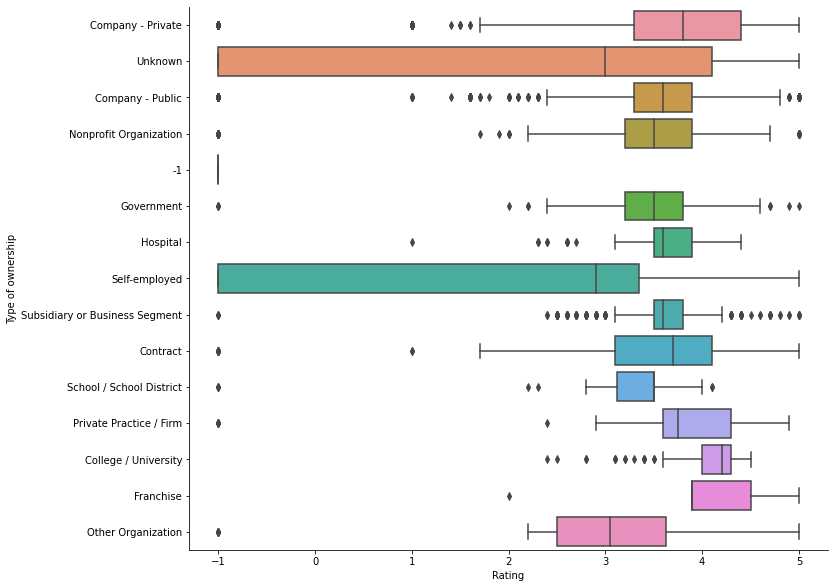

In [ ]:
# Show the data by using box plot
sns.catplot(x="Rating", y="Type of ownership",data=df, kind='box', height=8.27, aspect=11.7/8.27)

In [ ]:
# # Replace the -1 value to Unknown in this column 
# df['Type of ownership'] = df['Type of ownership'].str.replace('-1','Unknown')
# Replace the Unkown values to Other Organization of the Type of ownership in the data
df['Type of ownership'].replace(to_replace = 'Unknown', value = 'Other Organization', inplace=True)

**Finding:**

  I found the -1, Unknown and text.

  So, I will clean this column by replace the 'Unknown' to 'Other Organization'.

In [ ]:
# Show The values and counts it of Type of ownership in the data
df['Type of ownership'].value_counts()

Company - Private                 8706
Company - Public                  4083
-1                                 924
Nonprofit Organization             697
Subsidiary or Business Segment     694
Government                         321
College / University               216
Other Organization                 203
Hospital                           115
Contract                            96
Private Practice / Firm             52
School / School District            34
Self-employed                       12
Franchise                            7
Name: Type of ownership, dtype: int64

## **Looking the Sector**

I will show data in this columns and make visualization by using bar char and box plot.

In [ ]:
# Show The values and counts it of Sector in the data
df['Sector'].value_counts()

Information Technology                4521
Business Services                     3318
-1                                    2288
Finance                               1214
Health Care                            793
Insurance                              511
Biotech & Pharmaceuticals              485
Manufacturing                          424
Aerospace & Defense                    329
Government                             327
Education                              326
Retail                                 278
Accounting & Legal                     265
Media                                  242
Oil, Gas, Energy & Utilities           171
Transportation & Logistics             115
Non-Profit                             114
Telecommunications                     103
Consumer Services                       84
Construction, Repair & Maintenance      77
Real Estate                             63
Restaurants, Bars & Food Services       42
Arts, Entertainment & Recreation        32
Travel & To

**Finding:**

I found the -1 and the text in this column.

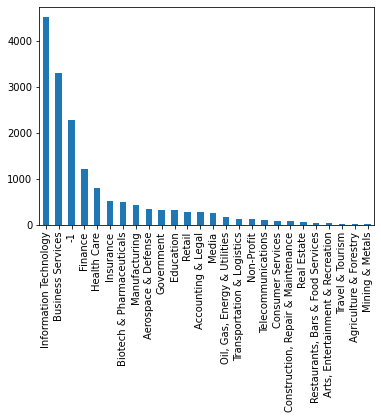

In [ ]:
# Show the data of Sector by using bar char
df['Sector'].value_counts().plot(kind='bar')

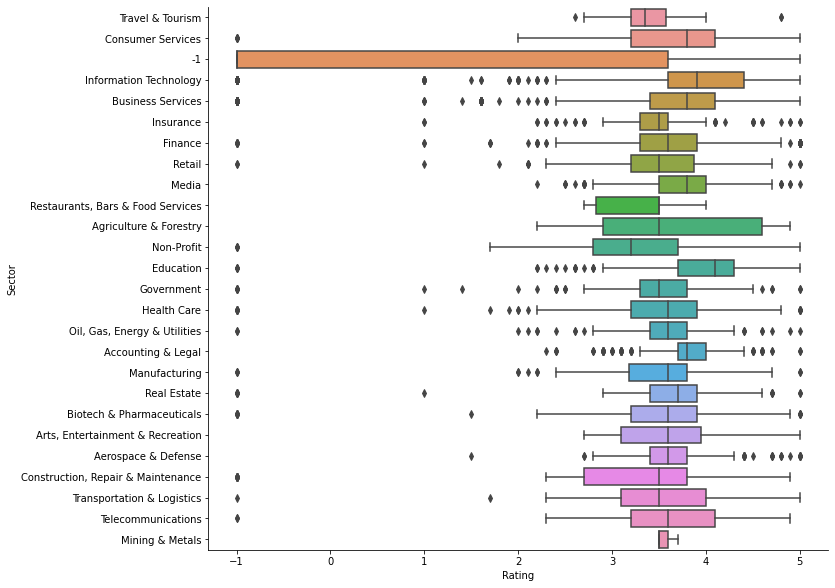

In [ ]:
# Show the data by using box plot
sns.catplot(x="Rating", y="Sector",data=df, kind='box', height=8.27, aspect=11.7/8.27)

## **Looking the Rating**

I will show data in this columns and make visualization by using bar char.

In [ ]:
# Show The values and counts it of Rating in the data
df['Rating'].value_counts()

-1.0    1596
 3.7    1155
 3.6    1093
 3.9    1050
 3.8    1048
 5.0     991
 3.5     930
 4.0     854
 4.1     828
 3.4     804
 3.3     711
 3.2     542
 3.1     496
 4.2     474
 4.3     380
 4.5     379
 4.4     364
 3.0     352
 4.6     291
 2.9     250
 4.7     221
 2.8     218
 2.5     186
 4.8     178
 4.9     158
 2.7     152
 2.6     148
 2.4      61
 2.0      56
 1.0      52
 2.3      41
 2.2      32
 1.6      30
 2.1      15
 1.9       9
 1.7       7
 1.5       3
 1.8       3
 1.4       2
Name: Rating, dtype: int64

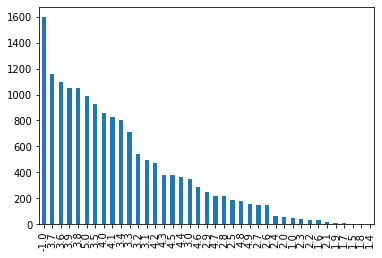

In [ ]:
# Show the data of Rating by using bar char
df['Rating'].value_counts().plot(kind='bar')

In [ ]:
# Show all data when the Rating = -1
df[df['Rating'] == -1]

,Job Title,Job Description,Rating,Company Name,Location,Headquarters,Size,Founded,Type of ownership,Industry,Sector,Revenue,Competitors,Easy Apply,Salary_min,Salary_max,Salary_estimate,Salary_avg
2,Data Science Manager,Decode_M\n\nhttps://www.decode-m.com/\n\nData ...,-1.0,Decode_M,"New York, NY","New York, NY",1 - 50,-1,Other Organization,-1,-1,Unknown / Non-Applicable,-1,1,111000.0,181000.0,Glassdoor,146000.0
7,Quantitative Research Associate,Seeking a quant to work with senior researcher...,-1.0,Enlightenment Research,"New York, NY","New York, NY",1 - 50,-1,Other Organization,-1,-1,Unknown / Non-Applicable,-1,1,111000.0,181000.0,Glassdoor,146000.0
44,Data Science Analyst,"Job Description\nOur client, a music streaming...",-1.0,MUSIC & Entertainment,"New York, NY","Marina del Rey, CA",Unknown,-1,Company - Public,-1,-1,Unknown / Non-Applicable,-1,0,120000.0,140000.0,Glassdoor,130000.0
53,Data Scientist,YOUR ROLE\n\nCompIQ is building a future where...,-1.0,CompIQ,"New York, NY","New York, NY",1 - 50,2015,Company - Private,Enterprise Software & Network Solutions,Information Technology,Unknown / Non-Applicable,-1,0,120000.0,140000.0,Glassdoor,130000.0
55,"Data Scientist, Analytics & Inference","Hello, World! Codecademy has helped over 45 mi...",-1.0,Codeacademy,"New York, NY",-1,-1,-1,-1,-1,-1,-1,-1,0,120000.0,140000.0,Glassdoor,130000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16051,Data Network Engineer,This position will be responsible for the miss...,-1.0,Brightstar Media Organization,"Grand Prairie, TX",-1,-1,-1,-1,-1,-1,-1,-1,0,30000.0,60000.0,Glassdoor,45000.0
16059,Data Integration Engineer II,Job Description\nThe Data Integration Engineer...,-1.0,Outsourced CIO LLC,"Arlington, TX",-1,-1,-1,-1,-1,-1,-1,-1,0,100000.0,160000.0,Glassdoor,130000.0
16079,Data Engineer/Irving TX/6+ months Contract,Data Platform Engineer\no Apache Pinot and Apa...,-1.0,"Suncap Technology, Inc.","Irving, TX",-1,-1,-1,-1,-1,-1,-1,-1,0,100000.0,160000.0,Glassdoor,130000.0
16101,Sr. Desktop Engineer,Sr. Desktop Engineer6 Month CTHLocation: Eules...,-1.0,Alleare Consulting,"Fort Worth, TX","Dallas, TX",1 - 50,-1,Company - Private,Staffing & Outsourcing,Business Services,1 to 5 million,-1,0,48000.0,74000.0,Glassdoor,61000.0


In [ ]:
# df['Rating'].replace(to_replace= -1, value= 0, inplace= True)

**Finding:**

I found the -1 and the continuous numbers in this column.

## **Looking the Industry**

I will show data in this columns and make visualization by using bar char and box plot.

In [ ]:
# Show The values and counts it of Industry in the data
df['Industry'].value_counts()

IT Services                        2315
-1                                 2291
Staffing & Outsourcing             1716
Computer Hardware & Software       1017
Consulting                          909
                                   ... 
Funeral Services                      1
Auto Repair & Maintenance             1
Self-Storage Services                 1
Museums, Zoos & Amusement Parks       1
Music Production & Distribution       1
Name: Industry, Length: 117, dtype: int64

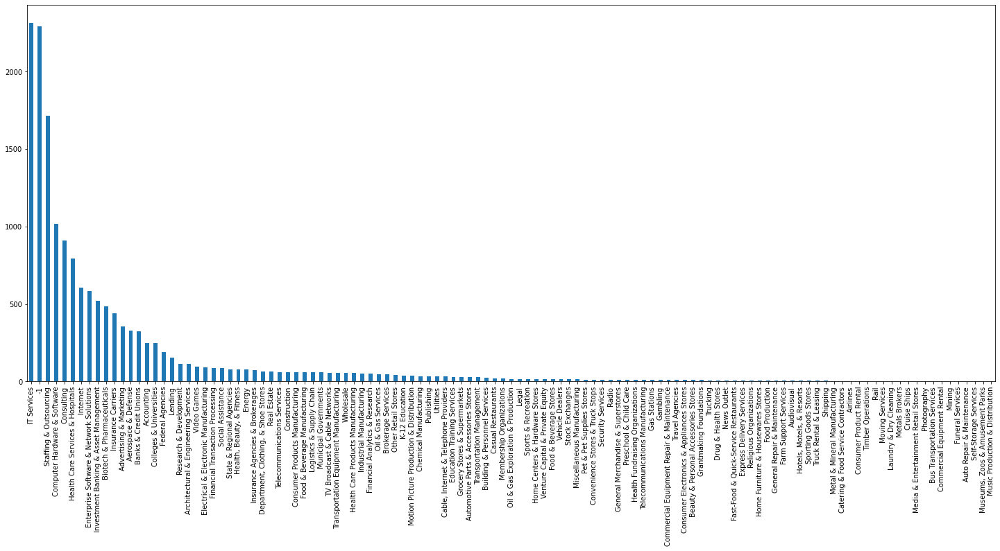

In [ ]:
# Show the data of Industry by using bar char
fig = df['Industry'].value_counts().plot(kind='bar', figsize=(25,10))

In [ ]:
df['Industry'].isin(['Unknown']).sum()

0

**Finding:**

I found the -1 and the text in this column. this column doesn't contain the Unknown values.

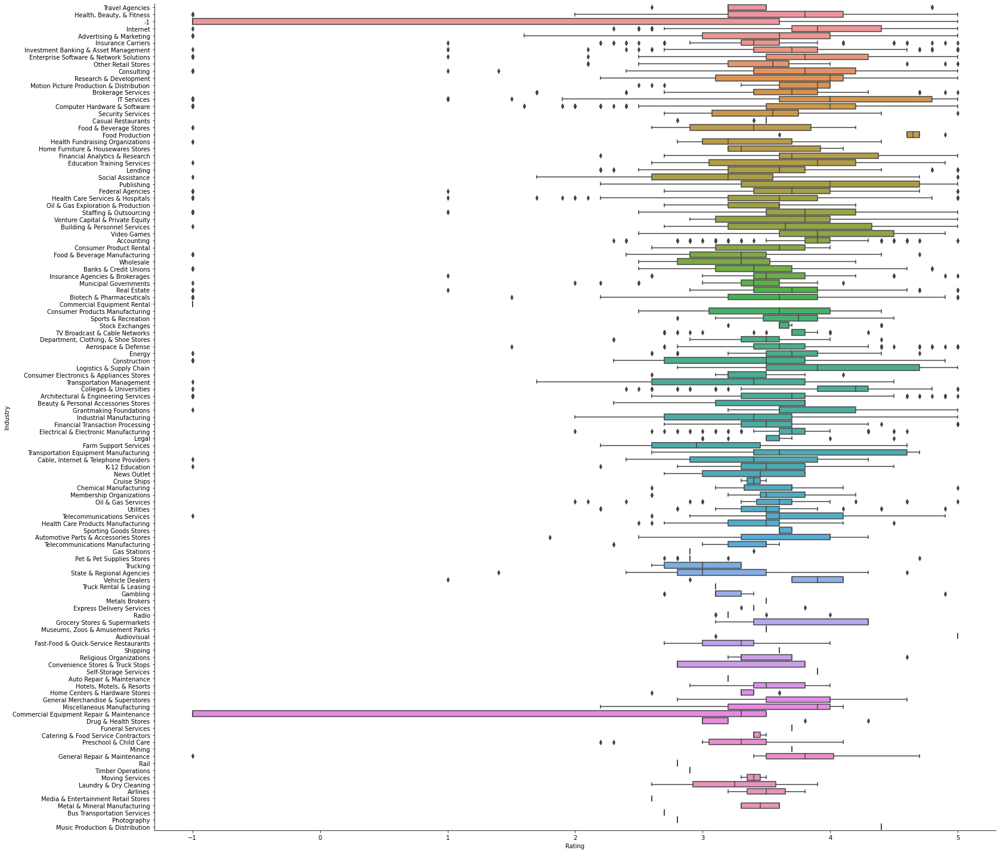

In [ ]:
# Show the data by using box plot
sns.catplot(x="Rating", y="Industry",data=df, kind='box', height=20, aspect=11.7/10)

## **Looking the Founded**

I will show data in this columns and make visualization by using bar char and box plot.

In [ ]:
# Show The values and counts it of Founded in the data
df['Founded'].value_counts()

-1       4249
 2008     609
 1999     448
 2002     406
 2000     365
         ... 
 1803       1
 1718       1
 1843       1
 1846       1
 1630       1
Name: Founded, Length: 218, dtype: int64

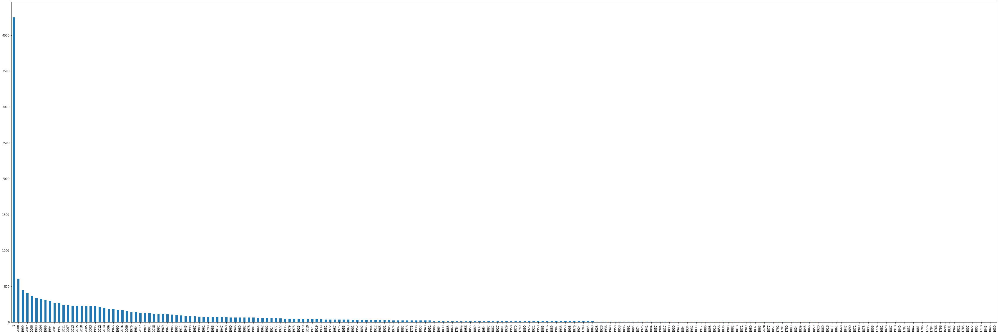

In [ ]:
# Show the data of Founded by using bar char
df['Founded'].value_counts().plot(kind='bar', figsize=(60,20))

**Finding:**

I found the -1 and the number of years in this column.

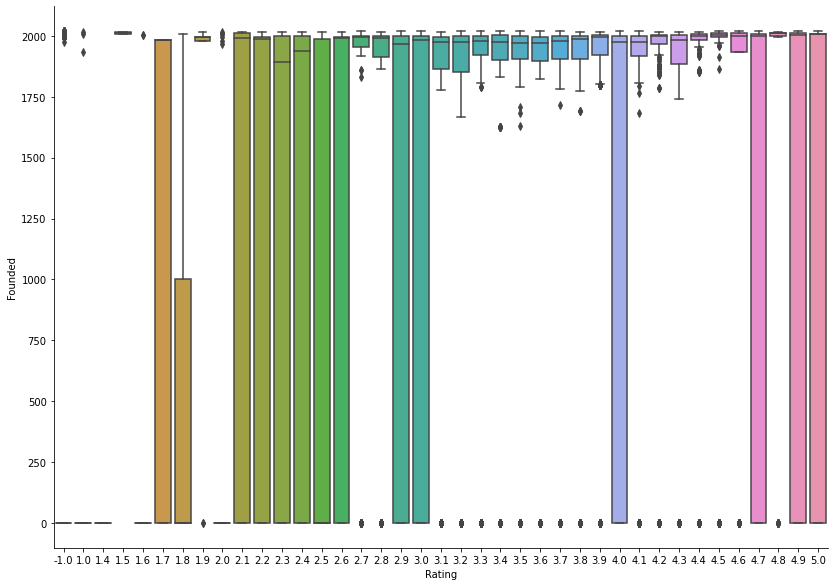

In [ ]:
# Show the data by using box plot
sns.catplot(x="Rating", y="Founded",data=df, kind='box', height=8.25, aspect=11.7/8.25)

## **Looking the Location**

I will show data in this columns and make visualization by using bar char and box plot. I will clean the values.

In [ ]:
# Show The values and counts it of Location in the data
df['Location'].value_counts()

New York, NY       1133
Austin, TX          989
Chicago, IL         945
San Diego, CA       929
Houston, TX         850
                   ... 
Leavenworth, KS       1
Reedley, CA           1
Visalia, CA           1
Mission, KS           1
Ponte Vedra, FL       1
Name: Location, Length: 763, dtype: int64

In [ ]:
# Show the data of Location by using bar char
df['Location'].value_counts().plot(kind='bar', figsize=(300,100))

In [ ]:
# check the Location have -1 or Unknown
df['Location'].isin(['-1', 'Unknown']).any()

False

In [ ]:
# Add two columns based on 'Location', to seperate city and state
df["Location_State"] = df["Location"].agg(lambda x: x[-2:])
df["Location_City"] = df["Location"].agg(lambda x: x[:-4])
df.drop('Location', inplace= True, axis= 1)

In [ ]:
# show the data 
df

,Job Title,Job Description,Rating,Company Name,Headquarters,Size,Founded,Type of ownership,Industry,Sector,Revenue,Competitors,Easy Apply,Salary_min,Salary_max,Salary_estimate,Salary_avg,Location_State,Location_City
0,Senior Data Scientist,"ABOUT HOPPER\n\nAt Hopper, we’re on a mission ...",3.5,Hopper\n3.5,"Montreal, Canada",501 - 1000,2007,Company - Private,Travel Agencies,Travel & Tourism,Unknown / Non-Applicable,-1,0,111000.0,181000.0,Glassdoor,146000.0,NY,New York
1,"Data Scientist, Product Analytics","At Noom, we use scientifically proven methods ...",4.5,Noom US\n4.5,"New York, NY",1001 - 5000,2008,Company - Private,"Health, Beauty, & Fitness",Consumer Services,Unknown / Non-Applicable,-1,0,111000.0,181000.0,Glassdoor,146000.0,NY,New York
2,Data Science Manager,Decode_M\n\nhttps://www.decode-m.com/\n\nData ...,-1.0,Decode_M,"New York, NY",1 - 50,-1,Other Organization,-1,-1,Unknown / Non-Applicable,-1,1,111000.0,181000.0,Glassdoor,146000.0,NY,New York
3,Data Analyst,Sapphire Digital seeks a dynamic and driven mi...,3.4,Sapphire Digital\n3.4,"Lyndhurst, NJ",201 - 500,2019,Company - Private,Internet,Information Technology,Unknown / Non-Applicable,"Zocdoc, Healthgrades",0,111000.0,181000.0,Glassdoor,146000.0,NJ,Lyndhurst
4,"Director, Data Science","Director, Data Science - (200537)\nDescription...",3.4,United Entertainment Group\n3.4,"New York, NY",51 - 200,2007,Company - Private,Advertising & Marketing,Business Services,Unknown / Non-Applicable,"BBDO, Grey Group, Droga5",0,111000.0,181000.0,Glassdoor,146000.0,NY,New York
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16155,Cloud Engineer,The Expertise You Have Proven expertise in dev...,4.5,PMG Global\n4.5,"Herndon, VA",1 - 50,-1,Company - Private,Computer Hardware & Software,Information Technology,1 to 5 million,-1,0,76000.0,128000.0,Glassdoor,102000.0,TX,Westlake
16156,Electrical Engineer,Lockheed Martin is seeking a Circuit and FPGA ...,2.9,Albin Engineering Services\n2.9,"Santa Clara, CA",51 - 200,1993,Company - Private,Staffing & Outsourcing,Business Services,5 to 10 million,-1,0,76000.0,128000.0,Glassdoor,102000.0,TX,Fort Worth
16157,Sr. Big Data Engineer,Posting Title Principal Data Engineer (Contrac...,3.7,Cincinnati Bell Technology Solutions\n3.7,"Cincinnati, OH",501 - 1000,-1,Company - Private,IT Services,Information Technology,100 to 500 million,-1,0,76000.0,128000.0,Glassdoor,102000.0,TX,Irving
16158,Senior Big Data / ETL Engineer,"Your Opportunity\n\nCharles Schwab & Co., Inc ...",3.5,Schwab\n3.5,"Dettenheim, Germany",Unknown,-1,Company - Public,-1,-1,Unknown / Non-Applicable,-1,0,76000.0,128000.0,Glassdoor,102000.0,TX,Westlake


**Finding:**

I found the text that the text's format is 'City, State'. this columns don't contain -1 or Unknown values.

So, 
  * I will split this columns and create columns to City and State.
  * I delete this column.

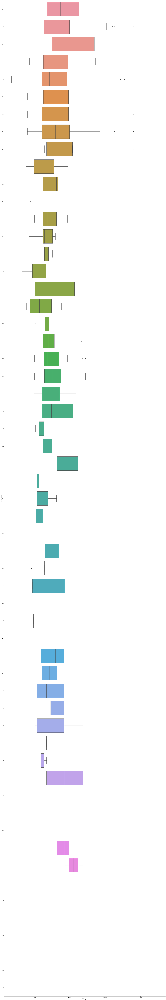

In [ ]:
# Show the data by using box plot
sns.catplot(x="Salary_avg", y="Location_State",data=df, kind='box', height=150, aspect=11.7/70)

## **Looking the Competitors**

I will show data in this columns and make visualization by using bar char and box plot.

In [ ]:
# Show The values and counts it of Competitors in the data
df['Competitors'].value_counts()

-1                                        11824
Google, Microsoft, Samsung Electronics       98
Google, Microsoft, Walmart                   96
Amazon, Accenture, Microsoft                 93
Adecco, Manpower                             70
                                          ...  
UMC, TSMC                                     1
Capita, G4S, Mitie                            1
Elsevier, Thomson Reuters, Google             1
NIKE, adidas                                  1
STS Aviation, Strom Aviation, Aerotek         1
Name: Competitors, Length: 1070, dtype: int64

In [ ]:
# check the Location have -1 or Unknown
df['Competitors'].isin(['Unknown']).any()

False

In [ ]:
# Show the data of Competitors by using bar char
df['Competitors'].value_counts().plot(kind='bar', figsize=(400,150))

**Finding:**

I found the -1 and text. this columns don't contain Unknown values.

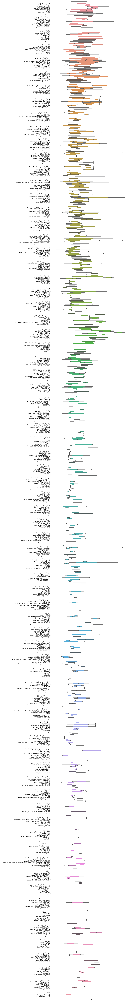

In [ ]:
# Show the data by using box plot
sns.catplot(x="Salary_avg", y="Competitors",data=df, kind='box', height=180, aspect=11.7/90)

## **Looking the Headquarters**

I will show data in this columns and make visualization by using bar char and box plot.

In [ ]:
# Show The values and counts it of Headquarters in the data
df['Headquarters'].value_counts()

New York, NY           1105
-1                      968
San Diego, CA           519
Chicago, IL             506
Woodridge, IL           440
                       ... 
Canyon Lake, TX           1
Liberty Lake, WA          1
Waterloo, Canada          1
Duderstadt, Germany       1
Westborough, MA           1
Name: Headquarters, Length: 1181, dtype: int64

**Finding:**
I found the -1 and text in this column. 

In [ ]:
# Show the data of Headquarters by using bar char
df['Headquarters'].value_counts().plot(kind='bar', figsize=(450,170))

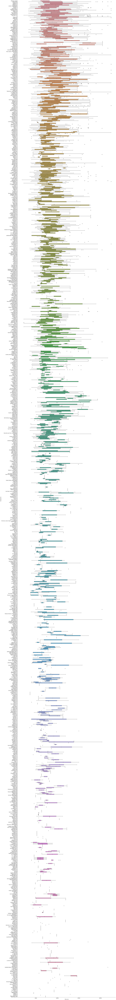

In [ ]:
# Show the data by using box plot
sns.catplot(x="Salary_avg", y="Headquarters",data=df, kind='box', height=200, aspect=11.7/100)

## **Looking the Company Name**

I will show data in this columns. I will clean the values.

In [ ]:
# Show The values and counts it of Company Name in the data
df['Company Name'].value_counts()

Staffigo Technical Services, LLC\n5.0               440
Diverse Lynx\n3.9                                   105
Kforce\n4.1                                         100
Apple\n4.1                                           98
Amazon\n3.9                                          96
                                                   ... 
WCI Consulting\n4.0                                   1
Business Control Systems, LP (Internal Position)      1
Kalkomey Enterprises, LLC\n4.4                        1
Academic Partnerships\n4.1                            1
Albin Engineering Services\n2.9                       1
Name: Company Name, Length: 6239, dtype: int64

In [ ]:
# get the all text before \n in this column
df['Company Name'] = df['Company Name'].str.partition('\n')[0]

In [ ]:
# Show The values and counts it of Company Name in the data
df['Company Name'].value_counts()

Staffigo Technical Services, LLC    440
Diverse Lynx                        105
Kforce                              100
Apple                                98
Amazon                               96
                                   ... 
IPKeys Technologies                   1
Crescent Bank and Trust               1
Coach-Net RV Motor Club, Inc.         1
Marlabs, Inc                          1
Albin Engineering Services            1
Name: Company Name, Length: 6108, dtype: int64

In [ ]:
df['Company Name'].isnull().sum()

2

In [ ]:
df = df[df['Company Name'].notna()]

In [ ]:
[df['Company Name'].str.isnumeric()]

[0        False
 1        False
 2        False
 3        False
 4        False
          ...  
 16155    False
 16156    False
 16157    False
 16158    False
 16159    False
 Name: Company Name, Length: 16158, dtype: bool]

In [ ]:
# Check the numeric values in the data 
com_name_number = df['Company Name'][df['Company Name'].str.isnumeric()].value_counts()

In [ ]:
com_name_number.index

Index(['1', '1884794'], dtype='object')

In [ ]:
# Keep rows where the city column is not in to_remove
df = df[~df['Company Name'].isin(com_name_number.index)]

In [ ]:
df['Company Name'].isin(['-1', 'Unknown']).any()

False

**Finding:**

* This column has null values. the count of null values are 2.
* I found the text and the number values. this columns don't contain -1 or Unknown values.

So, 
  * I drop the null values in this column.
  * I will get the all text before \n in this column.
  * I will delete the rows has numeric values.


## **Looking the Job Title**

In [ ]:
# Show The values and counts it of Job Title in the data
df['Job Title'].value_counts()

Data Analyst                                                        1381
Data Engineer                                                        729
Business Analyst                                                     518
Data Scientist                                                       282
Senior Data Analyst                                                  238
                                                                    ... 
BI Analyst/ETL Developer                                               1
Business Systems Analyst (Knowledge and awareness of Oracle HCM)       1
Inventory Operations Analyst                                           1
Business Analyst with Life science domain                              1
Future Opportunities: Software Development Engineer                    1
Name: Job Title, Length: 7207, dtype: int64

In [ ]:
# # Show the data of Job Title by using bar char
# df['Job Title'].value_counts().plot(kind='bar', figsize=(800,300))

In [ ]:
# import nltk
# import string
# # Download stopwords for NLP analysis
# nltk.download('stopwords') 
# stopwords = nltk.corpus.stopwords.words('english')

In [ ]:
# # Set up a set for removal
# remove_these = set(stopwords + list(string.punctuation) + list(string.digits))

In [ ]:
# # Check most frequent words in job titles after removing unwanted words
# import nltk
# jt_lst = df[df['Job Title'] != '-1']['Job Title'].tolist()
# word_list = []
# for item in jt_lst:
#     content = nltk.word_tokenize(item)
#     for word in content:
#         if word.lower() not in remove_these and word.lower() != 'data'and word.lower() != 'analyst' and word.lower() != 'data analyst':
#             word_list.append(word.lower())
# freq = nltk.FreqDist(word_list)
# plt.figure(figsize = (10,4))
# freq.plot(20)

<Figure size 1368x648 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'Job Title')

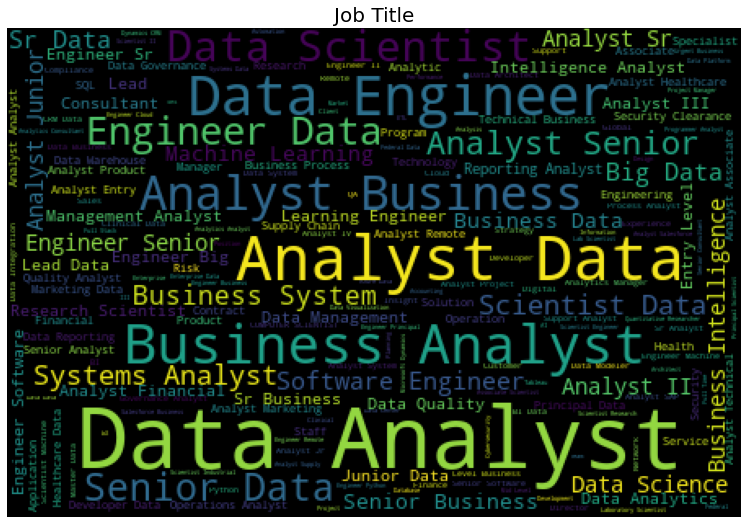

In [ ]:
from wordcloud import WordCloud, STOPWORDS

job_title=df['Job Title'][~pd.isnull(df['Job Title'])]
wordCloud = WordCloud(width=450,height= 300).generate(' '.join(job_title))
plt.figure(figsize=(19,9))
plt.axis('off')
plt.title(df['Job Title'].name,fontsize=20)
plt.imshow(wordCloud)
plt.show()

In [ ]:
# Parsing Job Seniority from Job Titles
def seniority(title):
    if 'sr' in title.lower() or 'senior' in title.lower() or 'sr' or 'sr.' in title.lower() or 'lead' in title.lower() or 'principal' in title.lower():
        return 'Senior'
    elif 'jr' in title.lower() or 'jr' in title.lower() or 'jr.' in title.lower() or 'junior' in title.lower() or 'entry' in title.lower():
        return 'Junior'
    elif 'intern' in title.lower() or 'internship' in title.lower() or 'temp' in title.lower():
        return 'Intern'
    else:
        return 'General'

df['job_seniority'] = df['Job Title'].apply(seniority)
df['job_seniority'].value_counts()

Senior    16154
Name: job_seniority, dtype: int64

In [ ]:
# df[df['job_seniority'] == 'Intern']

In [ ]:
df['Job Title'] = df['Job Title'].str.replace("Sr.", "Senior")
df['Job Title'] = df['Job Title'].str.replace("Sr", "Senior")
df['Job Title'] = df['Job Title'].str.replace("Senior", "Senior")
df['Job Title'] = df['Job Title'].str.replace('Jr.','Junior')
df['Job Title'] = df['Job Title'].str.replace('Jr','Junior')
df['Job Title'] = df['Job Title'].str.replace('â Junior','Junior')
df['Job Title'] = df['Job Title'].str.replace('Junior','Junior')
df['Job Title'] = df['Job Title'].str.replace('Sr.','Senior')
df['Job Title'] = df['Job Title'].str.replace('II','')
df['Job Title'] = df['Job Title'].str.replace('III','')
df['Job Title'] = df['Job Title'].str.replace('I','')

<Figure size 576x576 with 0 Axes>

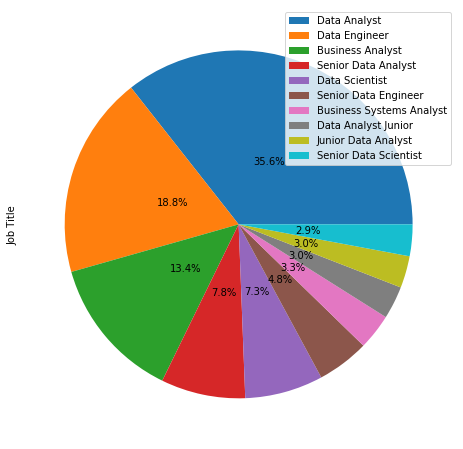

In [ ]:
plt.figure(figsize=(8,8))
df['Job Title'].value_counts()[:10].plot(kind='pie',autopct='%1.1f%%', labeldistance = None, pctdistance = 0.4, textprops={'fontsize': 10})
plt.legend( loc='best')

**Finding:**

* This column doesn't have null values.
* I found the text and the number values. this columns don't contain -1 or Unknown values.

So, 
  * I Found The Data Analysis is most repeating in this column.
  * I found some of words existing in the diffirent format such as Senior, Sr, Sr. So, I handle this cases.
  


## **Looking the Job Description**

In [ ]:
# Show The values and counts it of Job Description in the data
df['Job Description'].value_counts()

Job description\nInterpret data, analyze results using statistical techniques and provide ongoing reports\nDevelop and implement databases, data collection systems, data analytics and other strategies that optimize statistical efficiency and quality\nAcquire data from primary or secondary data sources and maintain databases/data systems\nIdentify, analyze, and interpret trends or patterns in complex data sets\nFilter and âœcleanâ data by reviewing computer reports, printouts, and performance indicators to locate and correct code problems\nWork with management to prioritize business and information needs\nLocate and define new process improvement opportunities\nRequirements\nProven work experience as a data analyst or business data analyst\nTechnical expertise regarding data models, database design development, data mining, and segmentation techniques\nStrong knowledge of and experience with reporting packages (Business Objects etc), databases (SQL, etc), programming (XML, JavaScript, o

In [ ]:
# # Parsing Skills from Job Descriptions
# df['Python'] = df['Job Description'].apply(lambda x : 1 if 'python' in x.lower() else 0)
# df['R'] = df['Job Description'].apply(lambda x : 1 if 'R ' in x else 0)
# df['SAS'] = df['Job Description'].apply(lambda x : 1 if 'SAS' in x else 0)
# df['SQL'] = df['Job Description'].apply(lambda x : 1 if 'sql' in x.lower() else 0)
# df['Java'] = df['Job Description'].apply(lambda x : 1 if 'java' in x.lower() else 0)
# df['AWS'] = df['Job Description'].apply(lambda x : 1 if 'aws' in x.lower() else 0)
# df['SPSS'] = df['Job Description'].apply(lambda x : 1 if 'spss' in x.lower() else 0)
# df['Excel'] = df['Job Description'].apply(lambda x : 1 if 'excel' in x.lower() else 0)
# df['Tableau'] = df['Job Description'].apply(lambda x : 1 if 'tableau' in x.lower() else 0)
# df['PowerBI'] = df['Job Description'].apply(lambda x : 1 if 'powerbi' in x.lower() or 'power bi' in x.lower() else 0)
# df['Hadoop'] = df['Job Description'].apply(lambda x : 1 if 'hadoop' in x.lower() else 0)
# df['Spark'] = df['Job Description'].apply(lambda x : 1 if 'spark' in x.lower() else 0)
# df['Machine Learning'] = df['Job Description'].apply(lambda x : 1 if 'machine learning' in x.lower() or 'ML' in x else 0)
# df['Statistics'] = df['Job Description'].apply(lambda x : 1 if 'statistics' in x.lower() or 'stats' in x.lower() or 'statistical' in x.lower() else 0)
# df['A/B Testing'] = df['Job Description'].apply(lambda x : 1 if 'a/b testing' in x.lower() else 0)

# df[['Python','R','SAS','SQL','Java','AWS','SPSS','Excel','Tableau','PowerBI',
#     'Hadoop','Spark','Machine Learning','Statistics','A/B Testing']].sample(3)

## **Handling Some of Features**

In [ ]:
# Replace the -1 to null values in all the data
df.replace(to_replace = ['-1', -1], value = np.nan, inplace=True)

In [ ]:
# check the counts of the -1 values in the data
df[df.isin(['-1',-1])].sum()

Job Title              0
Job Description        0
Rating               0.0
Company Name           0
Headquarters           0
Size                   0
Founded              0.0
Type of ownership      0
Industry               0
Sector                 0
Revenue                0
Competitors            0
Easy Apply           0.0
Salary_min           0.0
Salary_max           0.0
Salary_estimate        0
Salary_avg           0.0
Location_State         0
Location_City          0
job_seniority          0
dtype: object

In [ ]:
# Show the counts of the null values in the data 
df.isna().sum().sort_values(ascending = False)

Competitors          11818
Founded               4243
Industry              2285
Sector                2282
Rating                1590
Headquarters           962
Revenue                918
Size                   918
Type of ownership      918
Salary_estimate         46
Salary_avg              46
Salary_min              46
Salary_max              46
Location_City            0
Location_State           0
Job Title                0
Easy Apply               0
Job Description          0
Company Name             0
job_seniority            0
dtype: int64

In [ ]:
# df['Size'].replace(to_replace = 'Unknown', value = 'Other Organization', inplace=True)

In [ ]:
# sns.catplot(x="Easy Apply", y="Size",data=df)

In [ ]:
# sns.catplot(y="Size", kind="count", palette="ch:.25", data=df)

# **Missing Values**

In [ ]:
# show the count of null values in the data. if the data has null values, it will return the count of null in all columns otherwise it will return 0
total_miss = df.isnull().sum()
# Calclate the persange of null values in the data
percent_miss = (total_miss/df.isnull().count()*100)

# create data frame from the total null values and percentage it
missing_data = pd.DataFrame({'Total missing':total_miss,'missing %':percent_miss})
# Sort the data frame that has the total null values and percentage it
missing_data.sort_values(by='Total missing',ascending=False)

,Total missing,missing %
Competitors,11818,73.158351
Founded,4243,26.265940
Industry,2285,14.145103
Sector,2282,14.126532
Rating,1590,9.842763
Headquarters,962,5.955181
Revenue,918,5.682803
Size,918,5.682803
Type of ownership,918,5.682803
Salary_estimate,46,0.284759


In [ ]:
df  # Show the data set 

,Job Title,Job Description,Rating,Company Name,Headquarters,Size,Founded,Type of ownership,Industry,Sector,Revenue,Competitors,Easy Apply,Salary_min,Salary_max,Salary_estimate,Salary_avg,Location_State,Location_City,job_seniority
0,Senior Data Scientist,"ABOUT HOPPER\n\nAt Hopper, we’re on a mission ...",3.5,Hopper,"Montreal, Canada",501 - 1000,2007.0,Company - Private,Travel Agencies,Travel & Tourism,Unknown / Non-Applicable,NaN,0.0,111000.0,181000.0,Glassdoor,146000.0,NY,New York,Senior
1,"Data Scientist, Product Analytics","At Noom, we use scientifically proven methods ...",4.5,Noom US,"New York, NY",1001 - 5000,2008.0,Company - Private,"Health, Beauty, & Fitness",Consumer Services,Unknown / Non-Applicable,NaN,0.0,111000.0,181000.0,Glassdoor,146000.0,NY,New York,Senior
2,Data Science Manager,Decode_M\n\nhttps://www.decode-m.com/\n\nData ...,NaN,Decode_M,"New York, NY",1 - 50,NaN,Other Organization,NaN,NaN,Unknown / Non-Applicable,NaN,1.0,111000.0,181000.0,Glassdoor,146000.0,NY,New York,Senior
3,Data Analyst,Sapphire Digital seeks a dynamic and driven mi...,3.4,Sapphire Digital,"Lyndhurst, NJ",201 - 500,2019.0,Company - Private,Internet,Information Technology,Unknown / Non-Applicable,"Zocdoc, Healthgrades",0.0,111000.0,181000.0,Glassdoor,146000.0,NJ,Lyndhurst,Senior
4,"Director, Data Science","Director, Data Science - (200537)\nDescription...",3.4,United Entertainment Group,"New York, NY",51 - 200,2007.0,Company - Private,Advertising & Marketing,Business Services,Unknown / Non-Applicable,"BBDO, Grey Group, Droga5",0.0,111000.0,181000.0,Glassdoor,146000.0,NY,New York,Senior
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16155,Cloud Engineer,The Expertise You Have Proven expertise in dev...,4.5,PMG Global,"Herndon, VA",1 - 50,NaN,Company - Private,Computer Hardware & Software,Information Technology,1 to 5 million,NaN,0.0,76000.0,128000.0,Glassdoor,102000.0,TX,Westlake,Senior
16156,Electrical Engineer,Lockheed Martin is seeking a Circuit and FPGA ...,2.9,Albin Engineering Services,"Santa Clara, CA",51 - 200,1993.0,Company - Private,Staffing & Outsourcing,Business Services,5 to 10 million,NaN,0.0,76000.0,128000.0,Glassdoor,102000.0,TX,Fort Worth,Senior
16157,Senior Big Data Engineer,Posting Title Principal Data Engineer (Contrac...,3.7,Cincinnati Bell Technology Solutions,"Cincinnati, OH",501 - 1000,NaN,Company - Private,IT Services,Information Technology,100 to 500 million,NaN,0.0,76000.0,128000.0,Glassdoor,102000.0,TX,Irving,Senior
16158,Senior Big Data / ETL Engineer,"Your Opportunity\n\nCharles Schwab & Co., Inc ...",3.5,Schwab,"Dettenheim, Germany",Unknown,NaN,Company - Public,NaN,NaN,Unknown / Non-Applicable,NaN,0.0,76000.0,128000.0,Glassdoor,102000.0,TX,Westlake,Senior


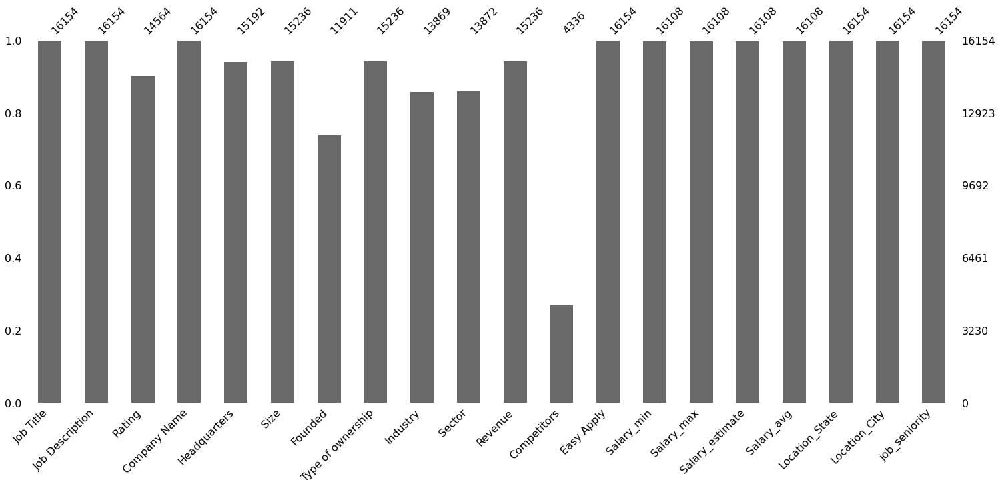

In [ ]:
# (bar chart) provides a simple plot where each bar represents a column within the data. The height of the bar indicates how complete that column
msno.bar(df)

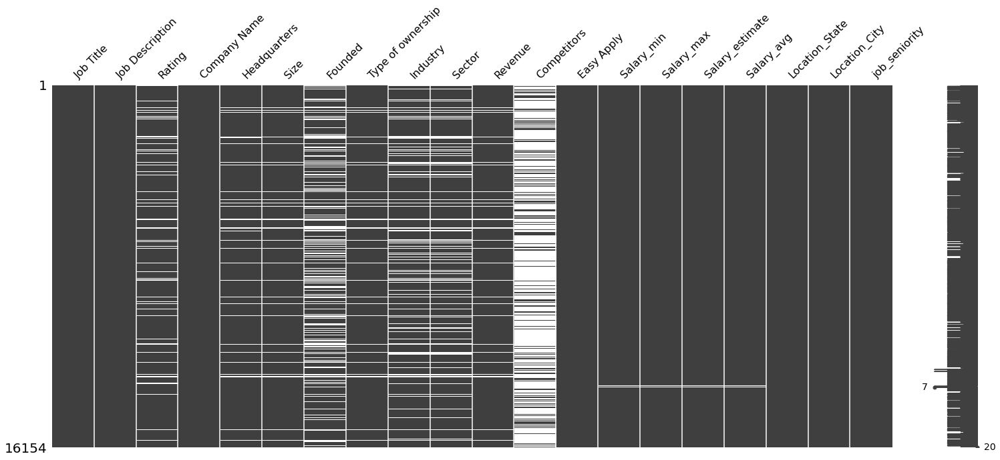

In [ ]:
# visualize missing values as a matrix
msno.matrix(df)

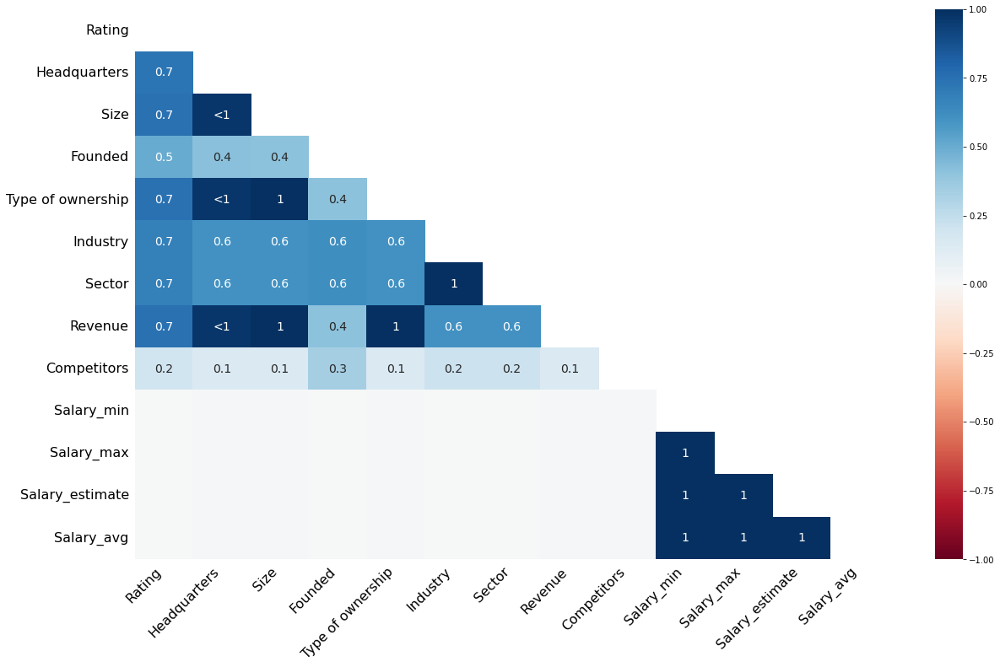

In [ ]:
#heapmap for correlation analysis
msno.heatmap(df)

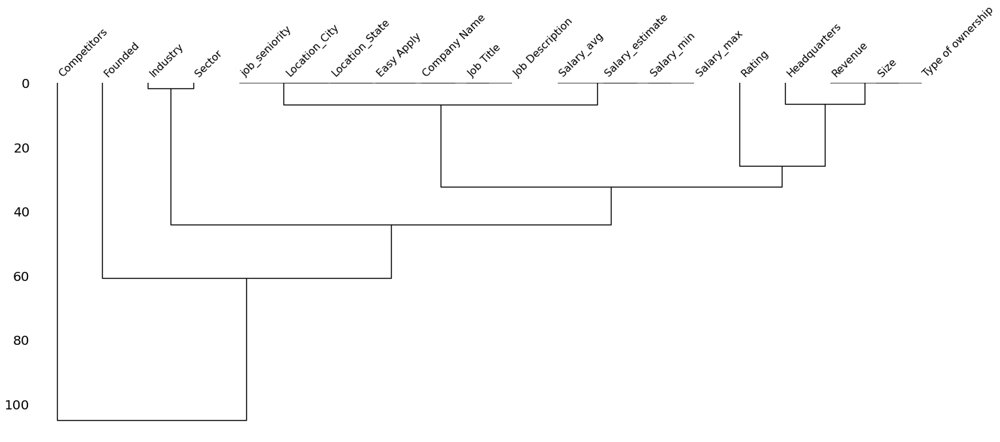

In [ ]:
#dendrogram plot
msno.dendrogram(df)

**Finding:**

* The data have missing values in some of the columns.
* The column's Competitors have 73% missing values.
* The MNAR mechanism between the columns. this columns are Rating, Size, Founded, Headquarters, Type of ownership, Industry and Revenue. when the rating, Size, Founded, Headquarters, Type of ownership, Industry and Revenue have null values together.
* The MAR mechanism between the columns. this columns are Industry and Sector.
<!-- * The MCAR mechanism in the data. the column Salary. -->

## **Handling the missing values**

In [ ]:
# drop the column's Competitors from the data 
df.drop('Competitors', inplace= True, axis=1)

In [ ]:
# Delete the rows when the rating, Size, Founded, Headquarters, Type of ownership, Industry and Revenue have null values together.
df.drop(df[(df['Rating'].isnull() & df['Size'].isnull() & df['Founded'].isnull() & df['Headquarters'].isnull() & df['Type of ownership'].isnull() & df['Industry'].isnull() & df['Revenue'].isnull())].index, axis= 0, inplace= True)

In [ ]:
# show the count of null values in the data. if the data has null values, it will return the count of null in all columns otherwise it will return 0
total_miss = df.isnull().sum()
# Calclate the persange of null values in the data
percent_miss = (total_miss/df.isnull().count()*100)

# create data frame from the total null values and percentage it
missing_data = pd.DataFrame({'Total missing':total_miss,'missing %':percent_miss})
# Sort the data frame that has the total null values and percentage it
missing_data.sort_values(by='Total missing',ascending=False)

,Total missing,missing %
Founded,3325,21.823313
Industry,1367,8.972171
Sector,1364,8.952481
Rating,672,4.410606
Headquarters,44,0.288790
Salary_min,41,0.269100
Salary_avg,41,0.269100
Salary_estimate,41,0.269100
Salary_max,41,0.269100
Location_City,0,0.000000


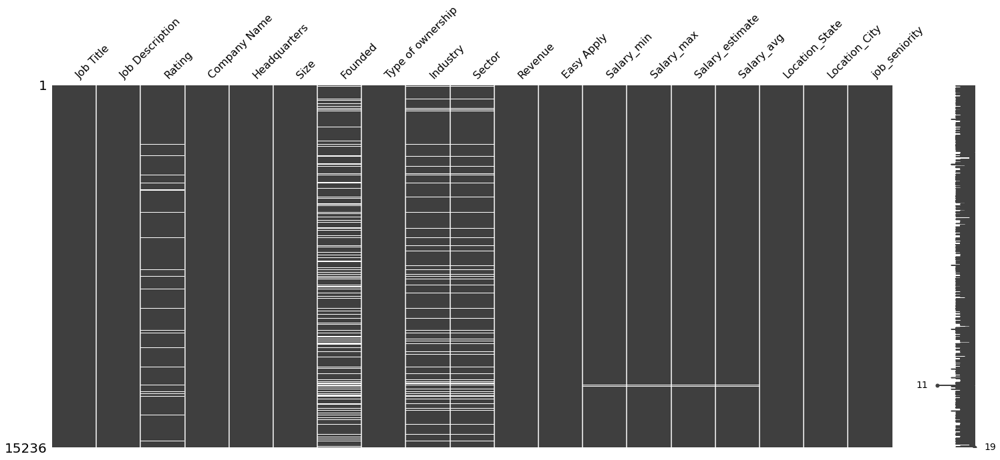

In [ ]:
# visualize missing values as a matrix
msno.matrix(df)

In [ ]:
df[(df['Industry'].isnull())].sample(5)

,Job Title,Job Description,Rating,Company Name,Headquarters,Size,Founded,Type of ownership,Industry,Sector,Revenue,Easy Apply,Salary_min,Salary_max,Salary_estimate,Salary_avg,Location_State,Location_City,job_seniority
170,Data Analyst,Job Description:\nLegal experience is required...,3.5,Pozent,"Piscataway, NJ",1 - 50,NaN,Contract,NaN,NaN,Less than 1 million,0.0,156000.0,254000.0,Glassdoor,205000.0,NY,New York,Senior
6547,Data Analyst (Healthcare Analytics),Job ID 1181873\n\nCategory Data Analytics\nSch...,2.3,Interpreta,"San Diego, CA",1 - 50,NaN,Company - Private,NaN,NaN,10 to 25 million,0.0,61000.0,79000.0,Glassdoor,70000.0,CA,San Diego,Senior
15830,Cybersecurity Senior Engineer - AM: Authentica...,"POSITION PURPOSE\n\nAt The Home Depot, our Cyb...",3.6,The Home Depot,"Atlanta, GA",10000+,1978.0,Company - Public,NaN,NaN,10+ billion,0.0,82000.0,130000.0,Employer,106000.0,TX,Austin,Senior
4142,Business Analyst,Salesforce Business Analyst / Consultant\n\nAs...,NaN,Pinkus Partners,"Chicago, IL",Unknown,NaN,Company - Public,NaN,NaN,Unknown / Non-Applicable,0.0,69000.0,131000.0,Glassdoor,100000.0,NY,New York,Senior
3534,Data Science Manager,Job Description\n\n• Provide senior level mana...,NaN,Sphere Software LLC,NaN,1 - 50,NaN,Company - Private,NaN,NaN,Unknown / Non-Applicable,0.0,62000.0,112000.0,Glassdoor,87000.0,TX,Austin,Senior


In [ ]:
# Delete the column's Sector from the data
df.drop('Sector', inplace=True, axis=1)

In [ ]:
# Fill the null values in the Rating 
df.Rating.fillna(0, inplace= True)

In [ ]:
# Fill the null values to the columns ('Founded', 'Industry', 'Headquarters', 'Salary_estimate')
imp_most_freq = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
df[['Founded', 'Industry', 'Headquarters', 'Salary_estimate']]= imp_most_freq.fit_transform(df[['Founded', 'Industry', 'Headquarters', 'Salary_estimate']])

In [ ]:
# Convert data type of the Founded
df['Founded'] = df['Founded'].astype(int)

In [ ]:
# check this columns have null values
df[['Founded', 'Industry', 'Headquarters']].isna().sum()

Founded         0
Industry        0
Headquarters    0
dtype: int64

In [ ]:
# Show the count of null values in the data 
df.isnull().sum()

Job Title             0
Job Description       0
Rating                0
Company Name          0
Headquarters          0
Size                  0
Founded               0
Type of ownership     0
Industry              0
Revenue               0
Easy Apply            0
Salary_min           41
Salary_max           41
Salary_estimate       0
Salary_avg           41
Location_State        0
Location_City         0
job_seniority         0
dtype: int64

In [ ]:
# Fill the null values to the columns ('Salary_min', 'Salary_max', 'Salary_avg')
imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
df[['Salary_min', 'Salary_max', 'Salary_avg']]= imp_mean.fit_transform(df[['Salary_min', 'Salary_max', 'Salary_avg']])

In [ ]:
# Show the count of null values in the data 
df.isnull().sum()

Job Title            0
Job Description      0
Rating               0
Company Name         0
Headquarters         0
Size                 0
Founded              0
Type of ownership    0
Industry             0
Revenue              0
Easy Apply           0
Salary_min           0
Salary_max           0
Salary_estimate      0
Salary_avg           0
Location_State       0
Location_City        0
job_seniority        0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15236 entries, 0 to 16159
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Job Title          15236 non-null  object 
 1   Job Description    15236 non-null  object 
 2   Rating             15236 non-null  float64
 3   Company Name       15236 non-null  object 
 4   Headquarters       15236 non-null  object 
 5   Size               15236 non-null  object 
 6   Founded            15236 non-null  int64  
 7   Type of ownership  15236 non-null  object 
 8   Industry           15236 non-null  object 
 9   Revenue            15236 non-null  object 
 10  Easy Apply         15236 non-null  float64
 11  Salary_min         15236 non-null  float64
 12  Salary_max         15236 non-null  float64
 13  Salary_estimate    15236 non-null  object 
 14  Salary_avg         15236 non-null  float64
 15  Location_State     15236 non-null  object 
 16  Location_City      152

Handling the missing values by Most Frequence and mean. Drop some features from the data.

In [ ]:
# get the shape of data when the Size is 10000+ 
df[df['Size'] == '10000+'].Revenue.shape

(3424,)

In [ ]:
# get the shape of data when the Size is 10000+ and Revenue is 10+ billion
df[((df['Size'] == '10000+') & (df['Revenue'] == '10+ billion'))].Revenue.shape

(1891,)

In [ ]:
# get the shape of data when the Revenue is 10+ billion
df[df['Revenue'] == '10+ billion'].shape

(1995, 18)

In [ ]:
# ((df['Size'] == '10000+') & (df['Revenue'] == '10+ billion')).sum()

In [ ]:
# df[((df['Size'] == '10000+') & (df['Revenue'] == '10+ billion'))].Revenue

In [ ]:
# ttest,pval = stats.ttest_1samp(df[df['Size'] == '10000+'].Revenue, '10+ billion')
# print(pval)
# if pval<0.05:
#     print("reject null hypothesis")
# else:
#     print("accept null hypothesis")

In [ ]:
# get the count and values of Size in the data
df['Size'].value_counts()

10000+          3424
51 - 200        2891
1001 - 5000     2557
1 - 50          2180
201 - 500       1645
501 - 1000      1325
5001 - 10000     885
Unknown          329
Name: Size, dtype: int64

In [ ]:
# get the count and values of data when the Size is 10000+ 
df[df['Size'] == '10000+'].Revenue.value_counts()

10+ billion                 1891
2 to 5 billion               442
5 to 10 billion              393
Unknown / Non-Applicable     340
1 to 2 billion               227
500 million to 1 billion      47
100 to 500 million            30
10 to 25 million              19
5 to 10 million               17
50 to 100 million             11
25 to 50 million               4
Less than 1 million            2
1 to 5 million                 1
Name: Revenue, dtype: int64

**What did the names of companies find between 1625 and 1799 years?**

In [ ]:
# get the Company Name when the founded between 1625 and 1799
df[df['Founded'].between(1625, 1799)]['Company Name'].unique()

array(['JPMorgan Chase', 'JPMorgan Chase Bank, N.A.', 'City of New York',
       'The Bank of New York Mellon', 'J.P. Morgan',
       'JPMorgan Chase & Co.', 'U.S. Navy', 'University of Pennsylvania',
       'Chubb', 'City of Philadelphia', 'Takeda', 'Barclays',
       'Barclays Bank', 'Molson Coors Brewing Company',
       'Department Of The Treasury', 'State Street Corporation',
       'City of San Antonio', 'BNY Mellon', 'London Stock Exchange Group',
       'University of California Berkeley', 'University of Georgia',
       'Legislative Branch',
       'Department of Elementary and Secondary Education',
       'Exec Office of Technology Services and Security',
       'Tufts Medical Center', 'Department of Environmental Protection',
       'University of Tennessee',
       'Maryland Department of Health & Mental Hygiene', 'Molson Coors',
       'City of Albuquerque', 'EMD Millipore', 'Merck KGaA',
       'University of Pittsburgh', 'Rutgers University',
       'UNC Chapel Hill', 'C

**Finding:**

From 1625 to 1799 years, The company's names are 'JPMorgan Chase', 'JPMorgan Chase Bank, N.A.', 'City of New York', 'The Bank of New York Mellon', 'J.P. Morgan', 'JPMorgan Chase & Co.', 'U.S. Navy', 'University of Pennsylvania', 'Chubb', 'City of Philadelphia', 'Takeda', 'Barclays', 'Barclays Bank', 'Molson Coors Brewing Company', 'Department Of The Treasury', 'State Street Corporation', 'City of San Antonio', 'BNY Mellon', 'London Stock Exchange Group', 'University of California Berkeley', 'University of Georgia', 'Legislative Branch', 'Department of Elementary and Secondary Education', 'Exec Office of Technology Services and Security', 'Tufts Medical Center', 'Department of Environmental Protection', 'University of Tennessee', 'Maryland Department of Health & Mental Hygiene', 'Molson Coors', 'City of Albuquerque', 'EMD Millipore', 'Merck KGaA', 'University of Pittsburgh', 'Rutgers University', 'UNC Chapel Hill' and 'City of Boston'

# **Categorical Features**

In [ ]:
# Show the all data
df.sample(5)

,Job Title,Job Description,Rating,Company Name,Headquarters,Size,Founded,Type of ownership,Industry,Revenue,Easy Apply,Salary_min,Salary_max,Salary_estimate,Salary_avg,Location_State,Location_City,job_seniority
4302,Business Analyst,Description\nMaintain and support Parts Applic...,3.7,"American Honda Motor Co., Inc.","Torrance, CA",10000+,2008,Subsidiary or Business Segment,Transportation Equipment Manufacturing,10+ billion,0.0,72000.0,134000.0,Glassdoor,103000.0,CA,Torrance,Senior
14848,Data Engineer,Overview Guidehouse is a leading management co...,3.4,Guidehouse,"Washington, DC",5001 - 10000,2018,Company - Private,Consulting,Unknown / Non-Applicable,0.0,74000.0,93000.0,Glassdoor,83500.0,TX,San Antonio,Senior
14899,Design Engineer,Essential Duties and Responsibilities* Produce...,3.0,Wastequip,"Charlotte, NC",1001 - 5000,1989,Company - Private,Industrial Manufacturing,500 million to 1 billion,0.0,44000.0,80000.0,Glassdoor,62000.0,TX,San Antonio,Senior
1704,Exciting Video Ecommerce Startup | Data Scient...,Job Description\nCompany Description\n\n***YOU...,4.7,Ciright,"Conshohocken, PA",51 - 200,1991,Company - Private,Enterprise Software & Network Solutions,Unknown / Non-Applicable,0.0,44000.0,80000.0,Glassdoor,62000.0,PA,Conshohocken,Senior
4015,Business Analyst,"Do you have 1 to 2 years business experience, ...",3.5,HUB International,"Chicago, IL",10000+,1998,Company - Private,Insurance Agencies & Brokerages,1 to 2 billion,0.0,85000.0,135000.0,Glassdoor,110000.0,NY,New York,Senior


In [ ]:
# List from the column's names need to Convert to numerical values
col_name = ['Size', 'Job Title', 'Job Description', 'Company Name', 'Headquarters', 'Type of ownership', 'Industry', 'Revenue', 'Salary_estimate', 'Location_State', 'Location_City', 'job_seniority'] 

le = LabelEncoder()
for i in col_name:
    df[i] = le.fit_transform(df[i])

In [ ]:
# Show the all data
df.sample(5)

,Job Title,Job Description,Rating,Company Name,Headquarters,Size,Founded,Type of ownership,Industry,Revenue,Easy Apply,Salary_min,Salary_max,Salary_estimate,Salary_avg,Location_State,Location_City,job_seniority
10905,3188,6216,0.0,2036,889,0,2017,1,58,11,0.0,48000.0,89000.0,1,68500.0,4,670,0
13548,1608,3835,2.8,2223,284,5,1998,1,62,12,0.0,42000.0,81000.0,1,61500.0,37,359,0
5200,4948,9765,3.6,3926,50,2,2008,12,99,12,0.0,41000.0,79000.0,1,60000.0,32,287,0
2717,4282,9129,4.1,2680,1034,1,1966,2,99,0,0.0,45000.0,78000.0,1,61500.0,32,498,0
11814,5327,9911,3.7,2336,43,6,2006,1,93,12,0.0,81000.0,163000.0,1,122000.0,15,218,0


<Figure size 8640x7920 with 0 Axes>

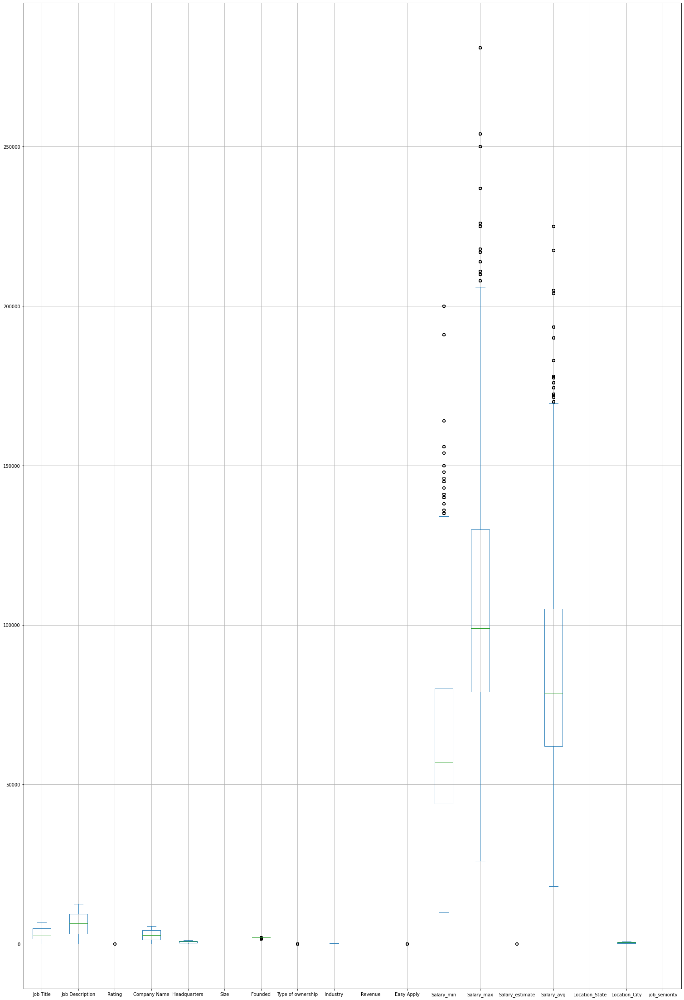

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(120,110))
 
# Creating plot
# plt.boxplot(df)
df.plot.box(grid='True',figsize=(26,40))
 
# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6744070bd0>],
 'caps': [<matplotlib.lines.Line2D at 0x7f674406ccd0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f674406bd50>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f674406b790>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f674406c710>,
  <matplotlib.lines.Line2D at 0x7f674406c550>]}

Text(0.5, 1.0, 'Rating Outlier')

Text(0.5, 0, 'Rating')

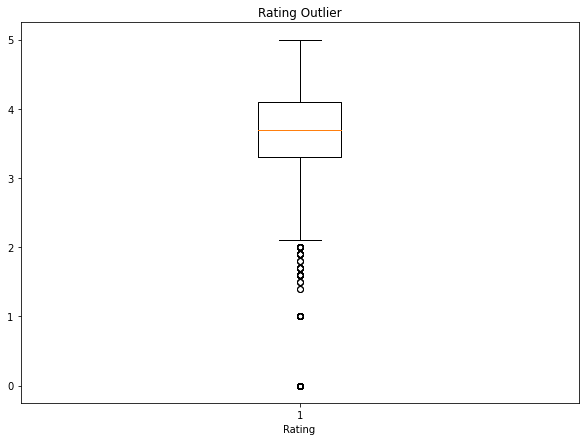

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df.Rating)

plt.title('Rating Outlier')
plt.xlabel('Rating')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f67440c3fd0>],
 'caps': [<matplotlib.lines.Line2D at 0x7f674409dd10>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f674409aed0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f674409d790>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f67440a0150>,
  <matplotlib.lines.Line2D at 0x7f67440a0790>]}

Text(0.5, 1.0, 'Job Title Outlier')

Text(0.5, 0, 'Job Title')

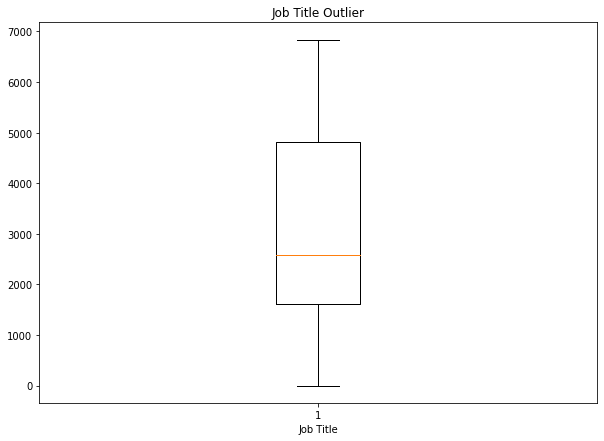

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Job Title'])

plt.title('Job Title Outlier')
plt.xlabel('Job Title')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6744a76d50>],
 'caps': [<matplotlib.lines.Line2D at 0x7f67443d28d0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f67443da910>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f67443da3d0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6744a76350>,
  <matplotlib.lines.Line2D at 0x7f67443d2390>]}

Text(0.5, 1.0, 'Job Description Outlier')

Text(0.5, 0, 'Job Description')

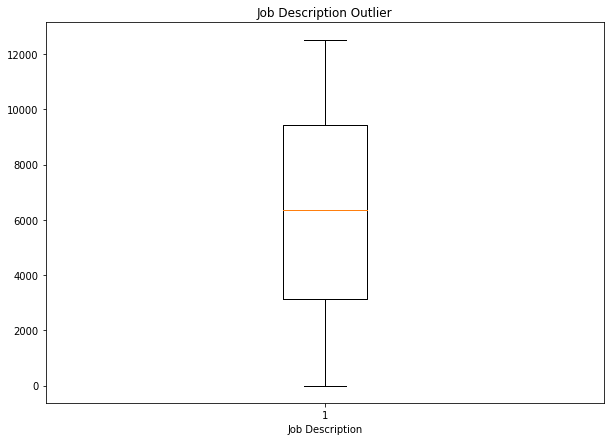

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Job Description'])

plt.title('Job Description Outlier')
plt.xlabel('Job Description')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f67443be050>],
 'caps': [<matplotlib.lines.Line2D at 0x7f67443c4090>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f674434c0d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f67443c4b50>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f67443be5d0>,
  <matplotlib.lines.Line2D at 0x7f67443beb10>]}

Text(0.5, 1.0, 'Size Outlier')

Text(0.5, 0, 'Size')

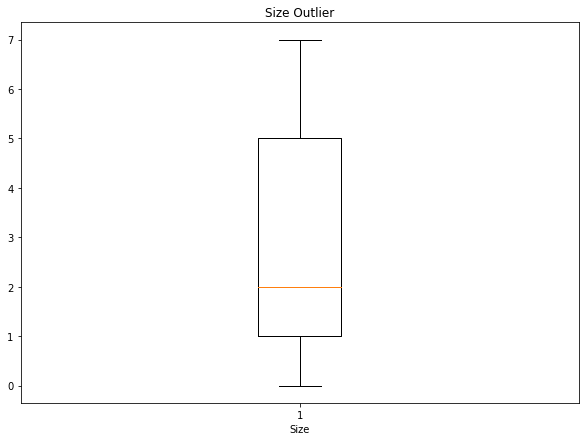

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Size'])

plt.title('Size Outlier')
plt.xlabel('Size')


# show plot
plt.show() 

{'boxes': [<matplotlib.lines.Line2D at 0x7f674432aa90>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6744330ad0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6744337b10>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f67443375d0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6744330050>,
  <matplotlib.lines.Line2D at 0x7f6744330590>]}

Text(0.5, 1.0, 'Founded Outlier')

Text(0.5, 0, 'Founded')

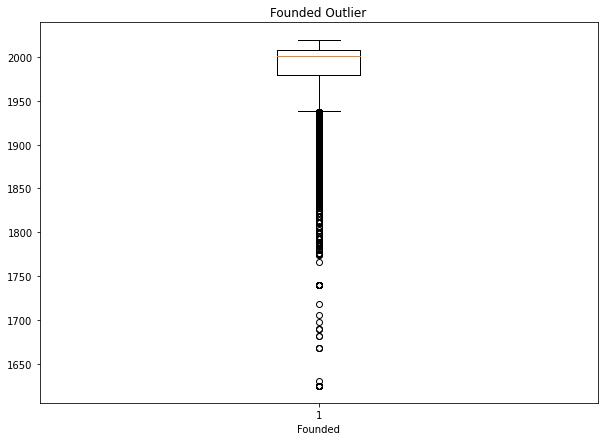

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Founded'])

plt.title('Founded Outlier')
plt.xlabel('Founded')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f67442a8750>],
 'caps': [<matplotlib.lines.Line2D at 0x7f67442ae790>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f67442b67d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f67442b6290>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f67442a8cd0>,
  <matplotlib.lines.Line2D at 0x7f67442ae250>]}

Text(0.5, 1.0, 'Type of ownership Outlier')

Text(0.5, 0, 'Type of ownership')

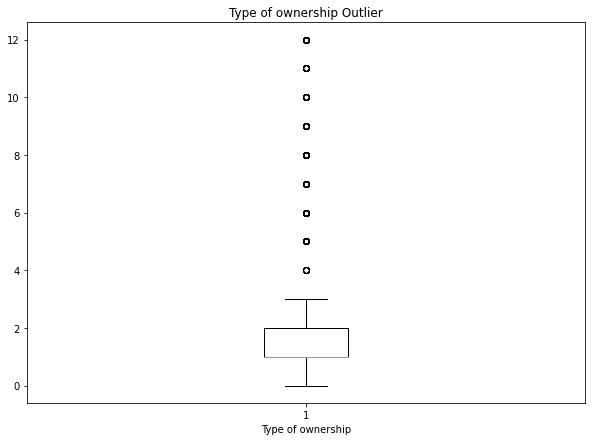

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Type of ownership'])

plt.title('Type of ownership Outlier')
plt.xlabel('Type of ownership')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6744211d50>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6744219d90>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6744220dd0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6744220890>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6744219310>,
  <matplotlib.lines.Line2D at 0x7f6744219850>]}

Text(0.5, 1.0, 'Industry Outlier')

Text(0.5, 0, 'Industry')

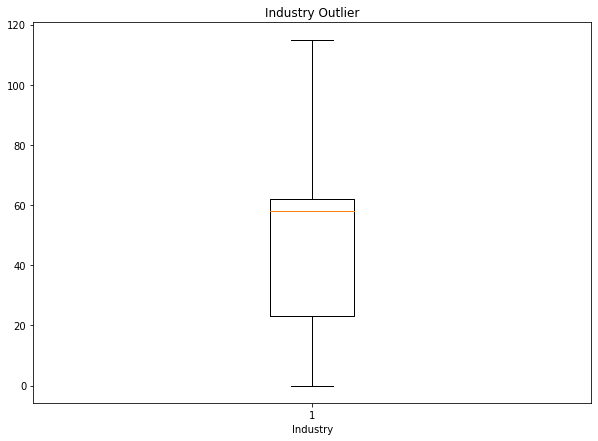

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Industry'])

plt.title('Industry Outlier')
plt.xlabel('Industry')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6744205450>],
 'caps': [<matplotlib.lines.Line2D at 0x7f674418a490>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f67441934d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f674418af50>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f67442059d0>,
  <matplotlib.lines.Line2D at 0x7f6744205f10>]}

Text(0.5, 1.0, 'Revenue Outlier')

Text(0.5, 0, 'Revenue')

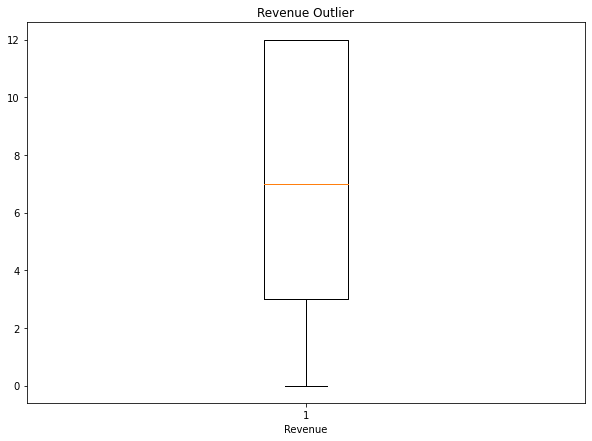

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Revenue'])

plt.title('Revenue Outlier')
plt.xlabel('Revenue')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f674416ca10>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6744170a50>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6744177a90>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6744177550>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f674416cf90>,
  <matplotlib.lines.Line2D at 0x7f6744170510>]}

Text(0.5, 1.0, 'Easy Apply Outlier')

Text(0.5, 0, 'Easy Apply')

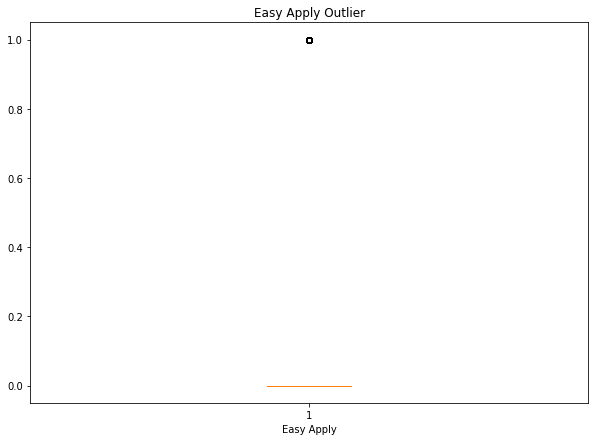

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Easy Apply'])

plt.title('Easy Apply Outlier')
plt.xlabel('Easy Apply')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6743f14b90>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6743f1abd0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6743f22c10>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6743f226d0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6743f1a150>,
  <matplotlib.lines.Line2D at 0x7f6743f1a690>]}

Text(0.5, 1.0, 'Mininmume Salary Outlier')

Text(0.5, 0, 'Mininmume Salary')

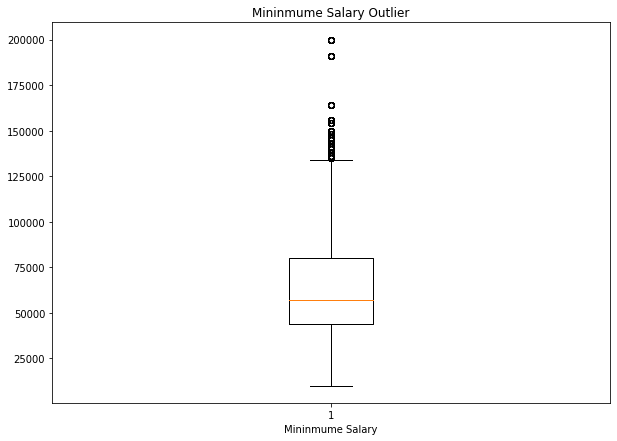

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Salary_min'])

plt.title('Mininmume Salary Outlier')
plt.xlabel('Mininmume Salary')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6743ec3850>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6743e4b890>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6743e538d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6743e53390>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6743ec3dd0>,
  <matplotlib.lines.Line2D at 0x7f6743e4b350>]}

Text(0.5, 1.0, 'Maximize Salary Outlier')

Text(0.5, 0, 'Maximize Salary')

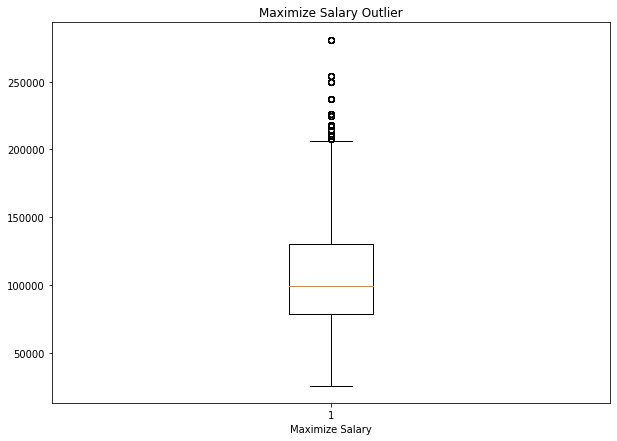

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Salary_max'])

plt.title('Maximize Salary Outlier')
plt.xlabel('Maximize Salary')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6743e31410>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6743e38450>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6743e3e490>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6743e38f10>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6743e31990>,
  <matplotlib.lines.Line2D at 0x7f6743e31ed0>]}

Text(0.5, 1.0, 'Estimate Salary Outlier')

Text(0.5, 0, 'Estimate Salary')

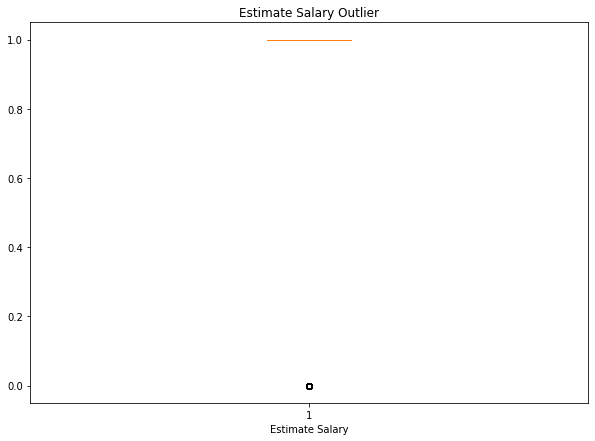

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Salary_estimate'])

plt.title('Estimate Salary Outlier')
plt.xlabel('Estimate Salary')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6743d9d590>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6743da25d0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6743dab610>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6743dab0d0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6743d9db10>,
  <matplotlib.lines.Line2D at 0x7f6743da2090>]}

Text(0.5, 1.0, 'Average Salary Outlier')

Text(0.5, 0, 'Average Salary')

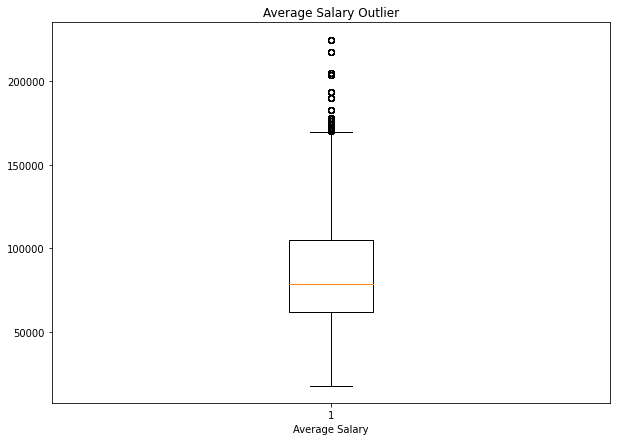

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Salary_avg'])

plt.title('Average Salary Outlier')
plt.xlabel('Average Salary')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6743d3eb50>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6743cc6b90>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6743ccebd0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6743cce690>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6743cc6110>,
  <matplotlib.lines.Line2D at 0x7f6743cc6650>]}

Text(0.5, 1.0, 'State Of Location Outlier')

Text(0.5, 0, 'State Of Location')

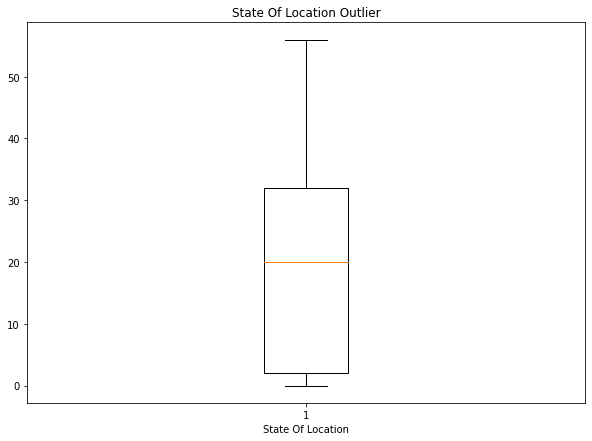

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Location_State'])

plt.title('State Of Location Outlier')
plt.xlabel('State Of Location')


# show plot
plt.show()

In [ ]:
df.columns

Index(['Job Title', 'Job Description', 'Rating', 'Company Name',
       'Headquarters', 'Size', 'Founded', 'Type of ownership', 'Industry',
       'Revenue', 'Easy Apply', 'Salary_min', 'Salary_max', 'Salary_estimate',
       'Salary_avg', 'Location_State', 'Location_City', 'job_seniority'],
      dtype='object')

{'boxes': [<matplotlib.lines.Line2D at 0x7f6743ab0f10>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6743ab8f50>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6743abff90>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6743abfa50>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6743ab84d0>,
  <matplotlib.lines.Line2D at 0x7f6743ab8a10>]}

Text(0.5, 1.0, 'City Location Outlier')

Text(0.5, 0, 'City Location')

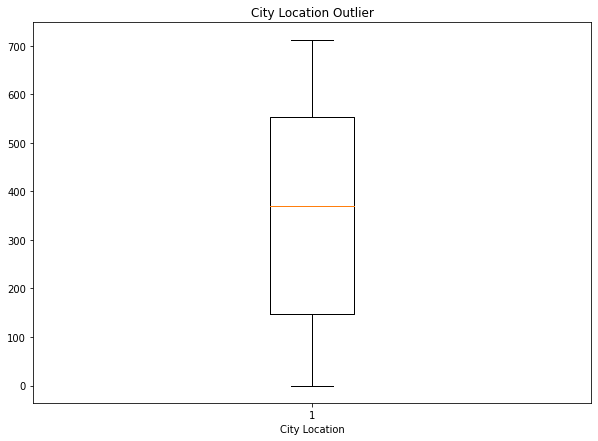

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Location_City'])

plt.title('City Location Outlier')
plt.xlabel('City Location')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f6743a20ad0>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6743a25b10>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6743a2cb50>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6743a2c610>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f6743a25090>,
  <matplotlib.lines.Line2D at 0x7f6743a255d0>]}

Text(0.5, 1.0, 'Industry Outlier')

Text(0.5, 0, 'Industry')

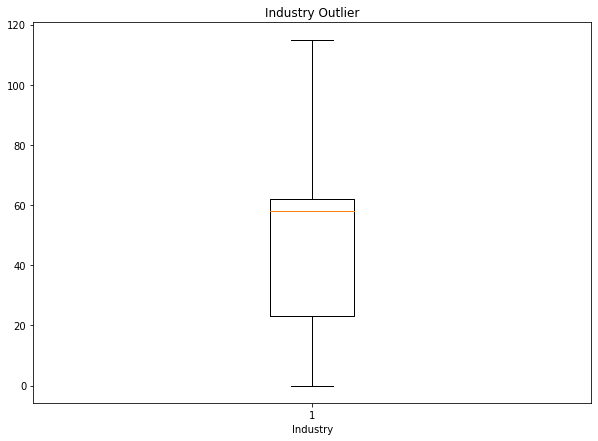

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['Industry'])

plt.title('Industry Outlier')
plt.xlabel('Industry')


# show plot
plt.show()

{'boxes': [<matplotlib.lines.Line2D at 0x7f674398f150>],
 'caps': [<matplotlib.lines.Line2D at 0x7f6743997190>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f67439a01d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f6743997c50>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f674398f6d0>,
  <matplotlib.lines.Line2D at 0x7f674398fc10>]}

Text(0.5, 1.0, 'Seniority Job Outlier')

Text(0.5, 0, 'Seniority Job')

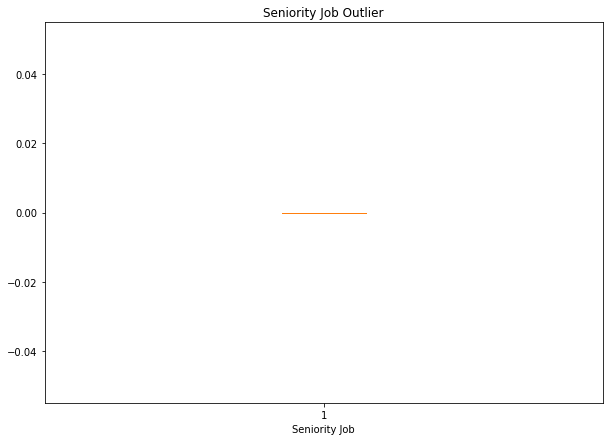

In [ ]:
# Show the data by using box plot
fig = plt.figure(figsize =(10,7))
 
# Creating plot
plt.boxplot(df['job_seniority'])

plt.title('Seniority Job Outlier')
plt.xlabel('Seniority Job')


# show plot
plt.show()

The data has Outliers. The column's Outlier are Salary_avg, Salary_estimate, Salary_max, Salary_min, Easy Apply, Type of ownership, Founded and Rating.

# **Hypothesis**

Do the companies which have more than 10000 employees that it's Revenue can be more than 10 billion?

In [ ]:
# get values and counts of the Size 
df['Size'].value_counts()

1    3424
6    2891
2    2557
0    2180
3    1645
5    1325
4     885
7     329
Name: Size, dtype: int64

In [ ]:
# get values and counts of the Revenue when the Size is more than 10000 employees
df[df['Size'] == 1].Revenue.value_counts()

3     1891
5      442
7      393
12     340
0      227
10      47
4       30
2       19
8       17
9       11
6        4
11       2
1        1
Name: Revenue, dtype: int64

In [ ]:
# get values and counts of the Revenue when the Size is more than 10000 employees and Revenue is more than 10 billion
df[((df['Size'] == 1) & (df['Revenue'] == 3))].Revenue.value_counts()

3    1891
Name: Revenue, dtype: int64

In [ ]:
# get values and counts of the Revenue when the Size is more than 10000 employees
df[df['Size'] == 1].Revenue.value_counts()

3     1891
5      442
7      393
12     340
0      227
10      47
4       30
2       19
8       17
9       11
6        4
11       2
1        1
Name: Revenue, dtype: int64

In [ ]:
# get values and counts of the Revenue when the Size is more than 10000 employees and Revenue is more than 10 billion
df[df['Size'] == 1].Revenue.mode()[0]

3

In [ ]:
df[df['Size'] == 1].Revenue.value_counts()

3     1891
5      442
7      393
12     340
0      227
10      47
4       30
2       19
8       17
9       11
6        4
11       2
1        1
Name: Revenue, dtype: int64

array([ 3,  7, 12,  0,  6,  5,  2, 10,  1,  8,  4,  9, 11])

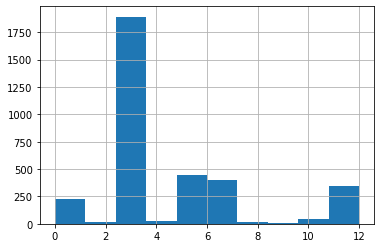

In [ ]:
df[df['Size'] == 1].Revenue.unique()
df[df['Size'] == 1].Revenue.hist()

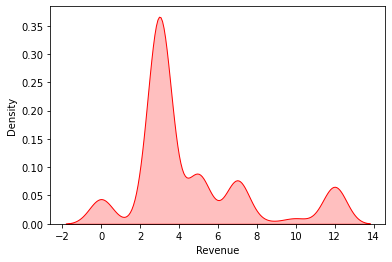

In [ ]:
ax = sns.kdeplot(df[df['Size'] == 1].Revenue, shade = True, color='r')

In [ ]:
np.mean(df[((df['Size'] == 1) & (df['Revenue'] == 3))].Revenue)

3.0

In [ ]:
ttest,pval = stats.ttest_1samp(df[((df['Size'] == 1) & (df['Revenue'] == 3))].Revenue, 0)
print('statistic= ', ttest,'pvalue= ', pval)
if pval<0.05:
    print("Accept Alternative Hypothesis, reject null hypothesis")
else:
    print("accept null hypothesis")

statistic=  inf pvalue=  0.0
Accept Alternative Hypothesis, reject null hypothesis


**Finding**

When The companies have more than 10000 employees that it's Revenue will be more than 10 billion that have 1891 rows . and The companies have more than 10000 employees that have 3424 rows and The company's Revenue will be more than 10 billion that have 1995 rows.

So, The data don't have only more than 10000 employees and it's Revenue will be more than 10 billion. because the data contain the more than 10000 employees that it's Revenue will be more than 10 billion but the data contain another data such as '10 to 25 million employees', '100 to 500 million employees' and other.

My Hypothesis is alternative hypothesis. this mean it correct Hypothesis and its pvalue is 0. 

**Null Hypothesis:** The companies which have more than 10000 employees that it's Revenue can't be more than 10 billion.

**Alternative Hypothesis:** The companies which have more than 10000 employees that it's Revenue can be more than 10 billion.

 

# **Feature Engineering**

I will choose the 2 columns to make them Feature Engineering. they will be Size and Revenue.

**Feature Engineering:**

* **Imputation**

    * It used to prepare and clean the data 
    * Some samples may miss data for some features. We need to detect those instances and remove those samples or replace empty values with something.
    * Column's Size, I clean this column by replace the 'to' to '-' and remove the word's employees from this column, also delete the null values in this column. 
    * Column's Revenue, I clean this column by replace the 'to' to '-' and remove the word's (USD) and '$' from this column.

* **Categorical Encoding**

    * Converting categorical values into numeric values.
    * In column's Size, I convert the categorical values to numeric values by using LabelEncoding. 
    * In column's Revenue, I convert the categorical values to numeric values by using LabelEncoding.
      
* **Handling Outliers**

    * Sometimes these values are mistakes and wrong measurements.
    * Column's Size doesn't have outliers. I checked the outliers by using the boxplot. 
    * Column's Revenue doesn't have outliers. I checked the outliers by using the boxplot.

* **Scaling**

    * In data processing, it is also known as data normalization and is generally performed during the data preprocessing step.
    * It used to normalize the range of independent variables or features of data.
    * I used the StandardScaler to Column's Size and Column's Revenue.

* **Feature Selection**
    * It is the process of selecting out the most significant features from a given dataset.
    * It will help you limit these features to a manageable number.
    * I used the Filter methods to Column's Size and Column's Revenue.